# Credit Scoring System

# Libraries

In [470]:
!pip install mlxtend

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [471]:
!pip install optbinning

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [473]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from optbinning import ContinuousOptimalBinning
from sklearn.model_selection import train_test_split
from optbinning import MulticlassOptimalBinning
import math

from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# Loading data

In [475]:
data_raw  = pd.read_excel("./Home_Eq_Dataset.xlsx")

data = data_raw.copy()

data.head()

,BAD,LOAN,MORTDUE,VALUE,REASON,JOB,YOJ,DEROG,DELINQ,CLAGE,NINQ,CLNO,DEBTINC
0,1,1100,25860.0,39025.0,HomeImp,Other,10.5,0.0,0.0,94.366667,1.0,9.0,NaN
1,1,1300,70053.0,68400.0,HomeImp,Other,7.0,0.0,2.0,121.833333,0.0,14.0,NaN
2,1,1500,13500.0,16700.0,HomeImp,Other,4.0,0.0,0.0,149.466667,1.0,10.0,NaN
3,1,1500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0,1700,97800.0,112000.0,HomeImp,Office,3.0,0.0,0.0,93.333333,0.0,14.0,NaN


## Data Inspection

In [476]:
target = 'BAD'
cat_features = ['REASON', 'JOB']

unwanted = {'BAD'}

num_features = [e for e in data.drop(cat_features, axis=1).columns.tolist() if e not in unwanted]

all_features = cat_features + num_features

# Double checking for missing values as 0 or nulls
# Printing all categories in categorial features
for col in cat_features:
    print(data[col].unique())

print(data[target].unique())

# Printing overview statistics of numeric features
data[num_features].describe()

['HomeImp' nan 'DebtCon']
['Other' nan 'Office' 'Sales' 'Mgr' 'ProfExe' 'Self']
[1 0]


,LOAN,MORTDUE,VALUE,YOJ,DEROG,DELINQ,CLAGE,NINQ,CLNO,DEBTINC
count,5960.000000,5432.000000,5848.000000,5445.000000,5252.000000,5380.000000,5652.000000,5450.000000,5738.000000,4693.000000
mean,18607.969799,73787.650037,101776.048741,8.922268,0.254570,0.449442,179.766275,1.186055,21.296096,33.779915
std,11207.480417,44473.809265,57385.775334,7.573982,0.846047,1.127266,85.810092,1.728675,10.138933,8.601746
min,1100.000000,2063.000000,8000.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.524499
25%,11100.000000,46292.000000,66075.500000,3.000000,0.000000,0.000000,115.116702,0.000000,15.000000,29.140031
50%,16300.000000,65026.000000,89235.500000,7.000000,0.000000,0.000000,173.466667,1.000000,20.000000,34.818262
75%,23300.000000,91535.750000,119824.250000,13.000000,0.000000,0.000000,231.562278,2.000000,26.000000,39.003141
max,89900.000000,399550.000000,855909.000000,41.000000,10.000000,15.000000,1168.233561,17.000000,71.000000,203.312149


In [477]:
data[num_features] = data[num_features].astype(float)
data[cat_features] = data[cat_features].astype(str)

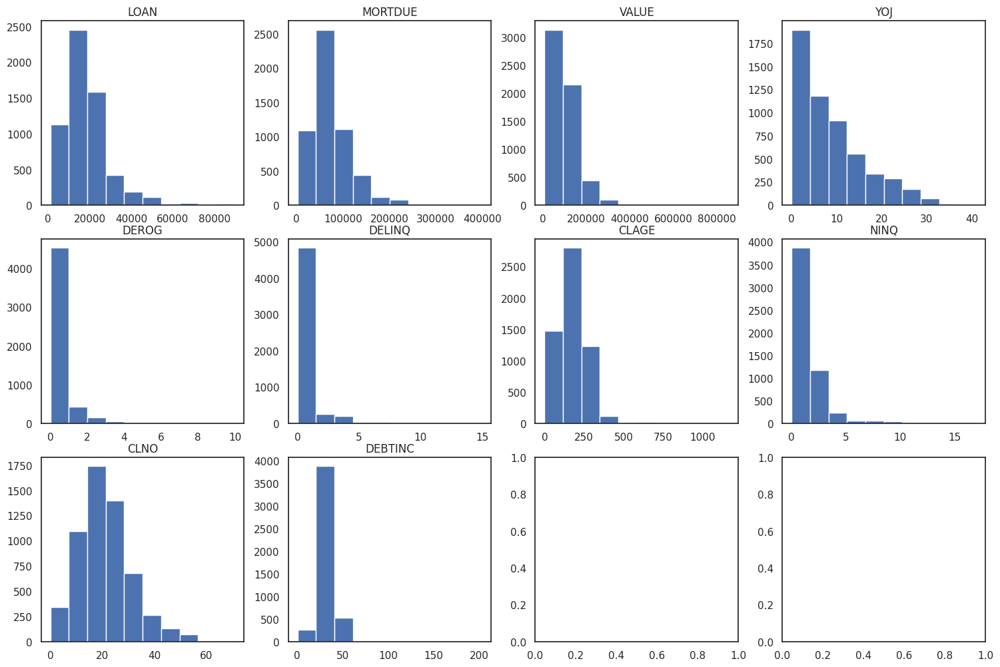

In [478]:
plt_cols = 4
plt_rows = math.ceil(len(num_features)/plt_cols)
fig, axs = plt.subplots(nrows=plt_rows, ncols=plt_cols, figsize=(15, 10))
i = 0

fig.tight_layout(pad=1)

for ax in axs.reshape(-1): 
  ax.hist(data[num_features[i]])
  ax.set_title(num_features[i])
  i = i + 1
  if i >= len(num_features):
    break

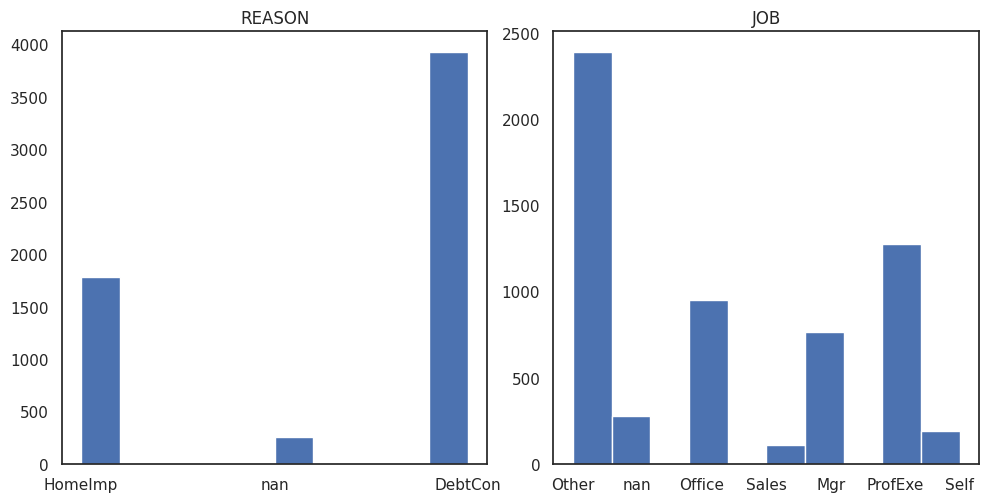

In [479]:
plt_cols = 2
plt_rows = math.ceil(len(cat_features)/plt_cols)
fig, axs = plt.subplots(nrows=plt_rows, ncols=plt_cols, figsize=(10, 5))
i = 0

fig.tight_layout(pad=1)

for ax in axs.reshape(-1): 
  ax.hist(data[cat_features[i]])
  ax.set_title(cat_features[i])
  i = i + 1
  if i >= len(cat_features):
    break

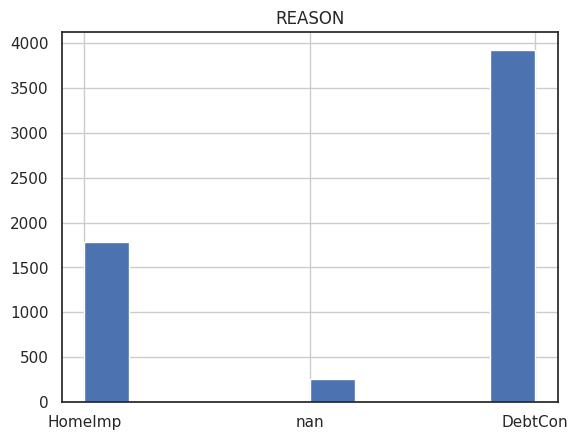

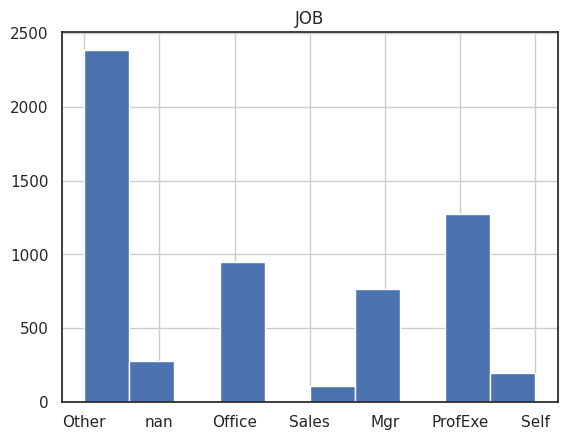

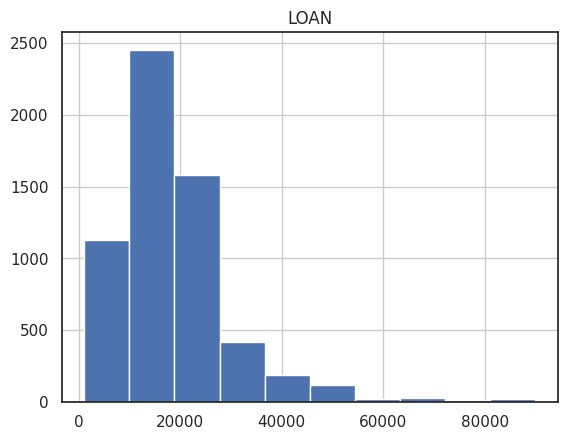

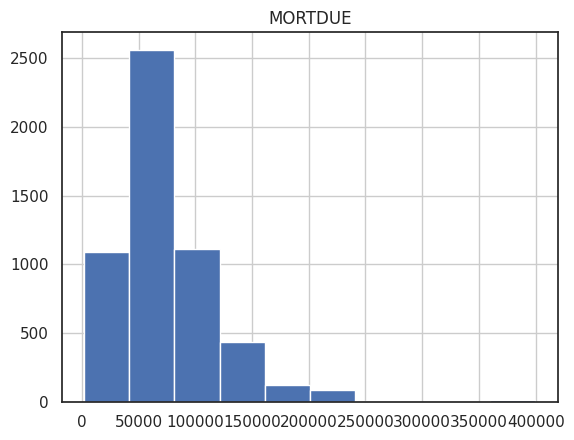

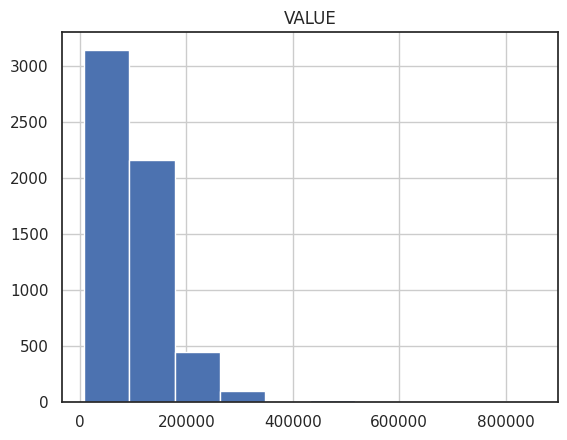

...

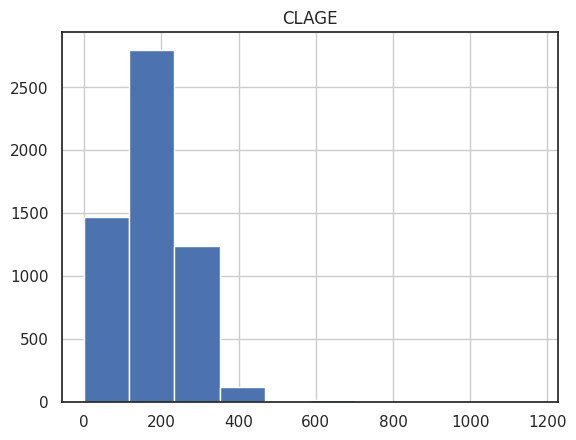

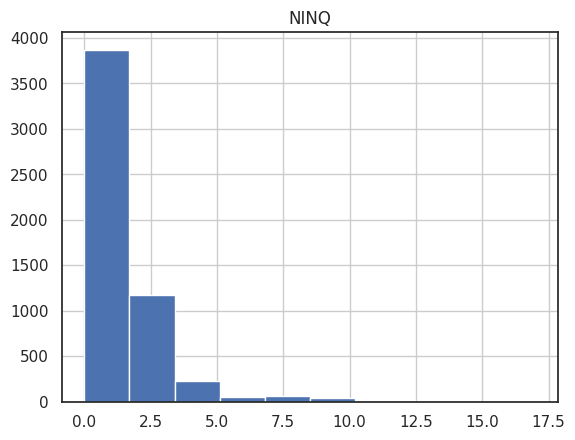

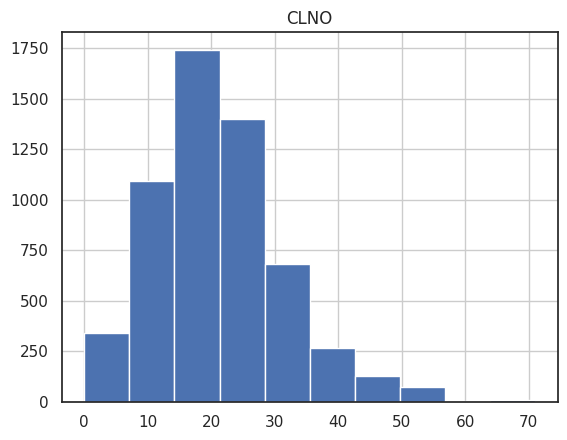

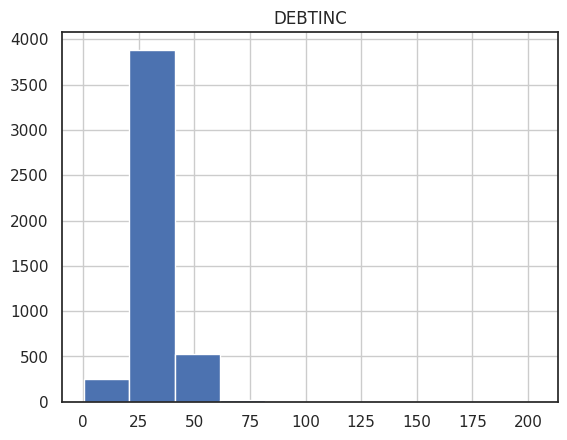

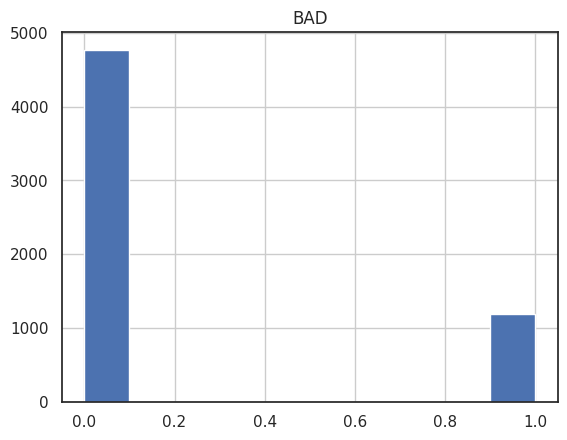

In [480]:
for col in cat_features:
    data[col].hist()
    plt.title(col)
    plt.show()

for col in num_features:
    data[col].hist()
    plt.title(col)
    plt.show()

data[target].hist()
plt.title(target)
plt.show()

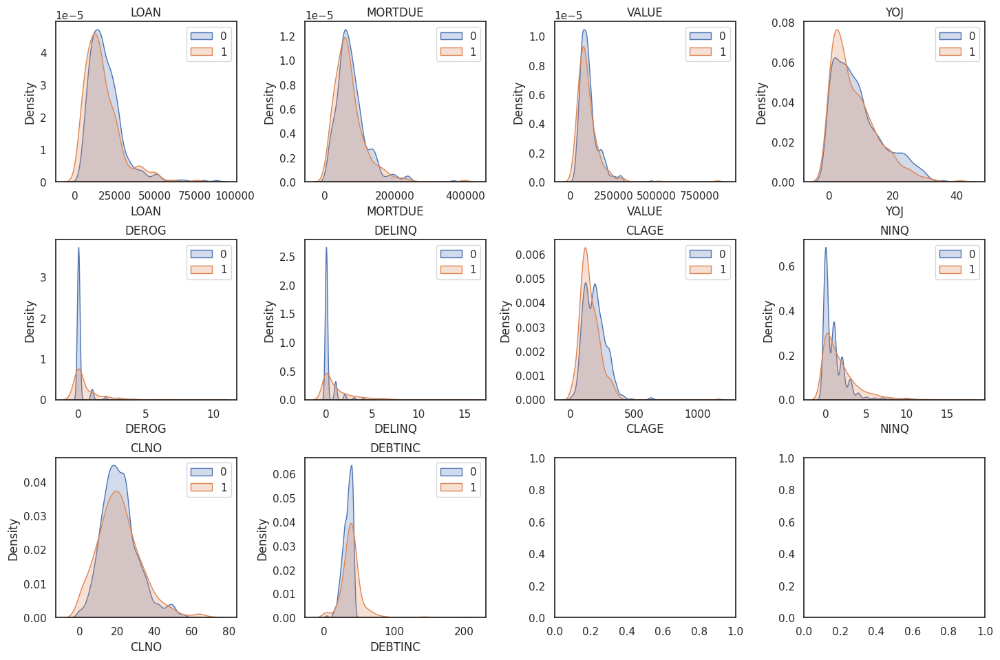

In [481]:
plt_cols = 4
plt_rows = math.ceil(len(num_features)/plt_cols)
fig, axs = plt.subplots(nrows=plt_rows, ncols=plt_cols, figsize=(15, 10))
i = 0

fig.tight_layout(pad=3)

for ax in axs.reshape(-1): 
  sns.set(style='white')
  sns.kdeplot( data[num_features[i]].loc[data[target] == 0], legend=True, fill=True, ax = ax)
  sns.kdeplot( data[num_features[i]].loc[data[target] == 1], legend=True, fill=True, ax = ax)
  ax.legend(labels=["0","1"])
  ax.set_title(num_features[i])
  i = i + 1
  if i >= len(num_features):
    break

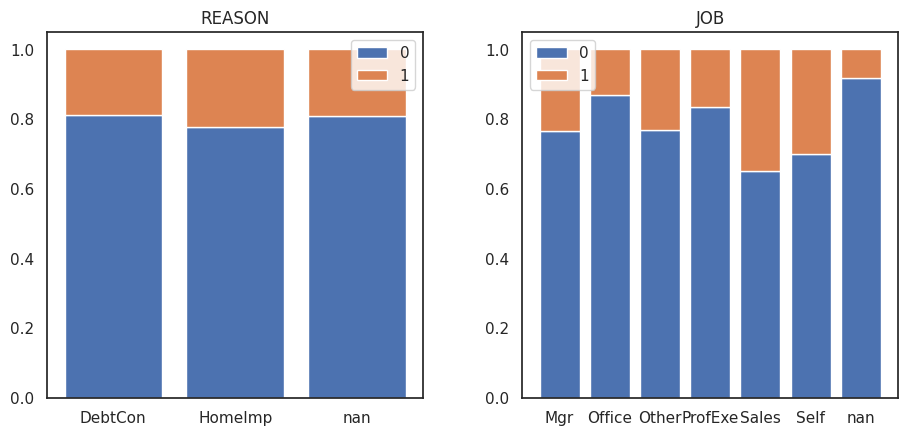

In [482]:
plt_cols = 2
plt_rows = math.ceil(len(cat_features)/plt_cols)
fig, axs = plt.subplots(nrows=plt_rows, ncols=plt_cols, figsize=(10, 5))
i = 0

fig.tight_layout(pad=3)

for ax in axs.reshape(-1): 

  table=pd.crosstab(data[cat_features[i]],data[target])

  ax.bar(list(table.div(table.sum(1).astype(float), axis=0)[0].index),
         table.div(table.sum(1).astype(float), axis=0)[0])
  ax.bar(list(table.div(table.sum(1).astype(float), axis=0)[1].index),
         table.div(table.sum(1).astype(float), axis=0)[1], 
         bottom = table.div(table.sum(1).astype(float), axis=0)[0])

  ax.legend(labels=["0","1"])
  ax.set_title(cat_features[i])
  i = i + 1
  if i >= len(cat_features):
    break

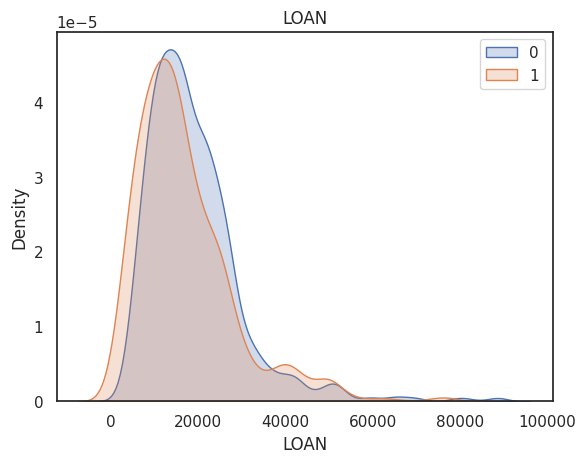

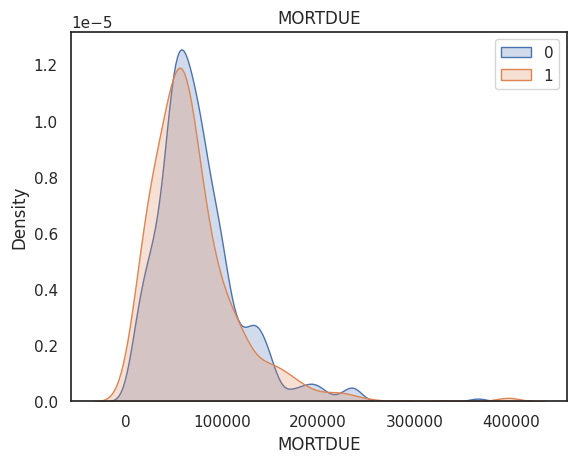

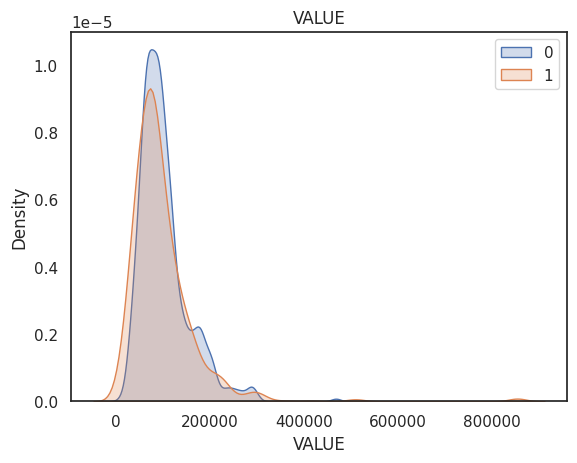

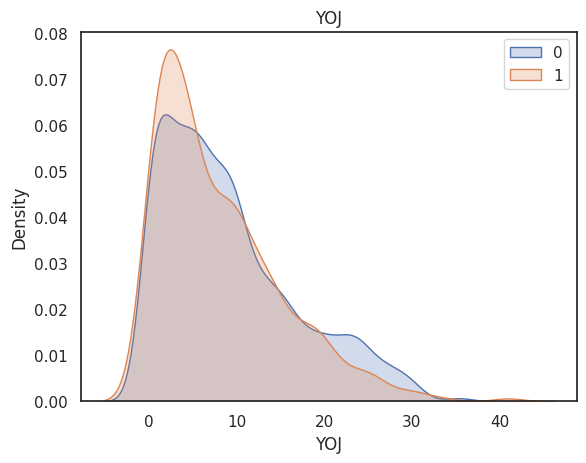

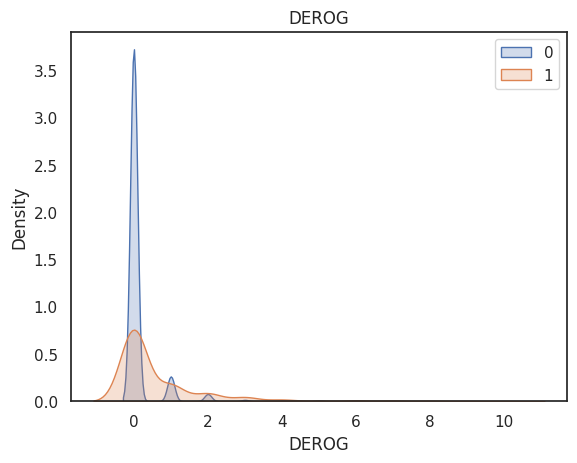

...

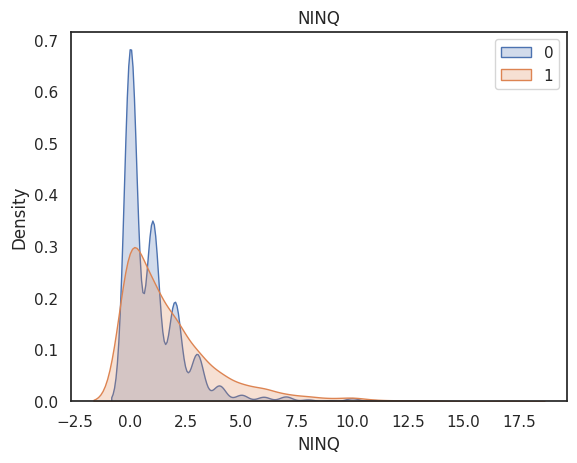

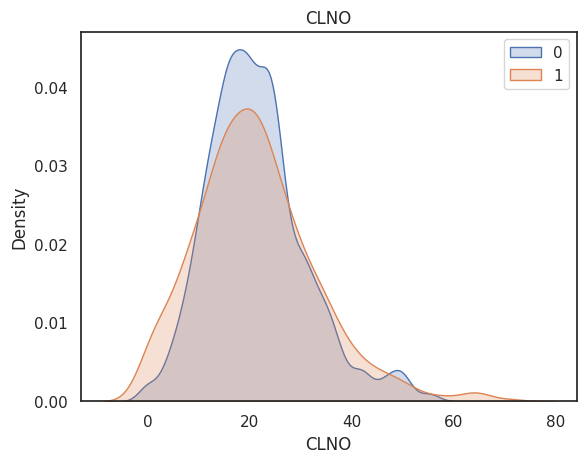

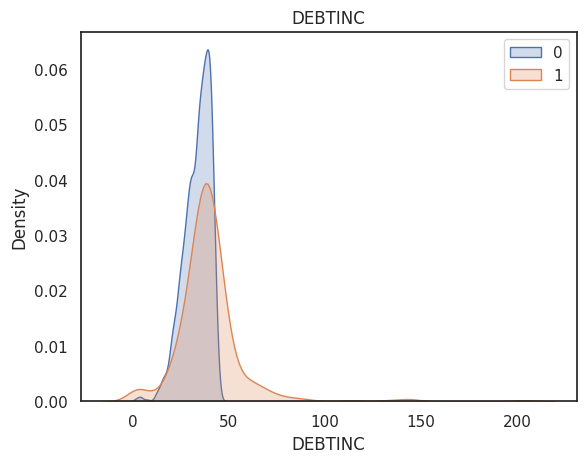

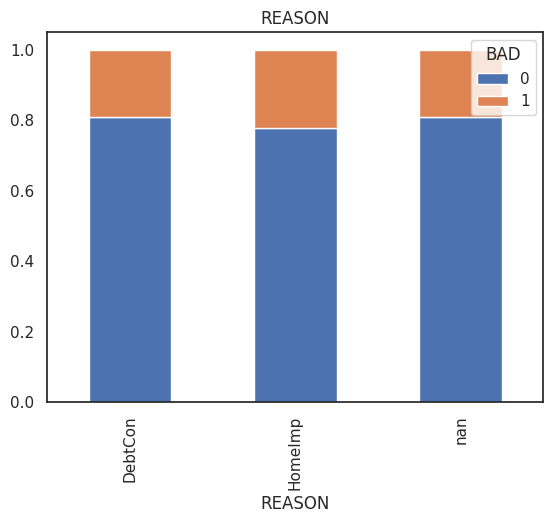

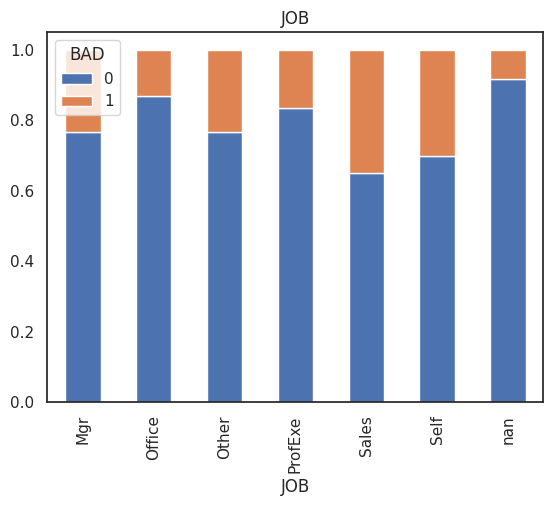

In [483]:
for col in num_features:
    sns.set(style='white')
    sns.kdeplot( data[col].loc[data[target] == 0], legend=True, fill=True)
    sns.kdeplot( data[col].loc[data[target] == 1], legend=True, fill=True)
    plt.legend(labels=["0","1"])
    plt.title(col)
    plt.show()

### Printing Categorial variables with respect to defaults ############################################################################

for col in cat_features:
    table=pd.crosstab(data[col],data[target])
    table.div(table.sum(1).astype(float), axis=0).plot(kind='bar', stacked=True)
    plt.title(col)
    plt.show()

    #interesting distribution of defaults at cost_type variable -> adding to the logit fuunction


## Missing

dataset has large number of missing values
due to the large proportion of missing values in some features (`DEROG` and `DEBTINC`) missing values will be approached as separate category.



In [484]:
data['REASON'][data['REASON'] == 'nan'] = np.NaN
data['JOB'][data['JOB'] == 'nan'] = np.NaN


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [485]:
data.transpose().isna().max().sum()

2596

In [486]:
data.isna().sum()/len(data)

BAD        0.000000
LOAN       0.000000
MORTDUE    0.088591
VALUE      0.018792
REASON     0.042282
JOB        0.046812
YOJ        0.086409
DEROG      0.118792
DELINQ     0.097315
CLAGE      0.051678
NINQ       0.085570
CLNO       0.037248
DEBTINC    0.212584
dtype: float64

# Feature Engineering

## Binning Continuos Variables

Continuos variable will be discretized for scoring model. 

Bin borders are determined using optbinning library.

optbinnig library is using Information Value in Fine binning (5% bins). Bin borders are then made at the fine bins where significant difference in IV is present. Bins with similar IV are merged into one bin, and thus coarse binning is done.


LOAN : OPTIMAL
{'Feature': 'LOAN', 'IV': 0.04915938471240034, 'Splits': [array([ 6050., 10050., 15050., 17050., 21050., 25050., 27650., 37950.])]}
-------------------------------------------------
OptimalBinning: Continuous Binning Table Analysis
-------------------------------------------------

  General metrics

    IV                       0.04915938
    WoE                      1.02670901
    WoE (normalized)         5.14649766
    HHI                      0.13937311
    HHI (normalized)         0.05331043
    Quality score            0.00062526

  Monotonic trend                valley

  Significance tests

    Bin A  Bin B  t-statistic      p-value
        0      1     7.600465 1.374836e-13
        1      2     1.837392 6.631797e-02
        2      3     2.163951 3.068239e-02
        3      4     0.297429 7.661918e-01
        4      5     0.005188 9.958616e-01
        5      6     2.638370 8.485868e-03
        6      7    -1.921024 5.507803e-02
        7      8    -3.348141 8.59

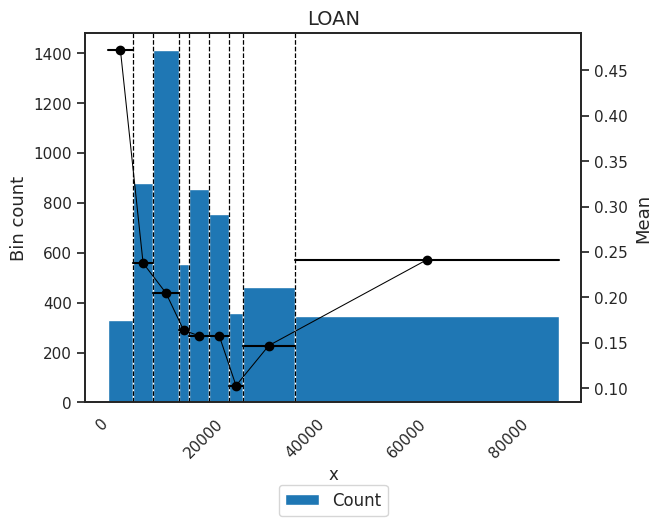


MORTDUE : OPTIMAL
{'Feature': 'MORTDUE', 'IV': 0.02766243637673979, 'Splits': [array([ 35009.5,  42368.5,  59984.5,  81993. , 124069.5])]}
-------------------------------------------------
OptimalBinning: Continuous Binning Table Analysis
-------------------------------------------------

  General metrics

    IV                       0.02766244
    WoE                      0.41753753
    WoE (normalized)         2.09295515
    HHI                      0.16792498
    HHI (normalized)         0.04905712
    Quality score            0.00555096

  Monotonic trend            descending

  Significance tests

    Bin A  Bin B  t-statistic  p-value
        0      1     0.857592 0.391484
        1      2     2.225534 0.026553
        2      3     0.273429 0.784546
        3      4     0.634482 0.525827
        4      5     0.233656 0.815288



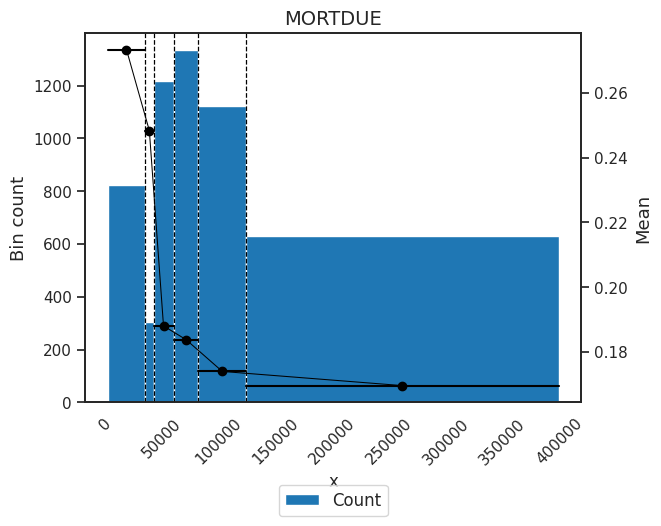


VALUE : OPTIMAL
{'Feature': 'VALUE', 'IV': 0.053382280077473976, 'Splits': [array([ 47504. ,  86410. ,  92908. ,  97974. , 104625.5, 124946. ,
       202928. ])]}
-------------------------------------------------
OptimalBinning: Continuous Binning Table Analysis
-------------------------------------------------

  General metrics

    IV                       0.05338228
    WoE                      1.38020541
    WoE (normalized)         6.91843924
    HHI                      0.20067655
    HHI (normalized)         0.11186283
    Quality score            0.10867666

  Monotonic trend                valley

  Significance tests

    Bin A  Bin B  t-statistic      p-value
        0      1     6.559259 1.017128e-10
        1      2     1.635228 1.025018e-01
        2      3     2.008739 4.495124e-02
        3      4    -0.917210 3.593828e-01
        4      5    -0.421352 6.736347e-01
        5      6    -1.926426 5.421957e-02
        6      7    -1.420749 1.560727e-01



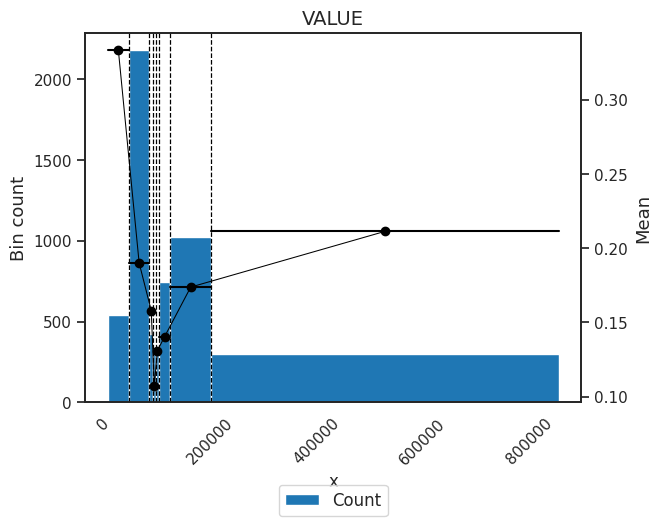


YOJ : OPTIMAL
{'Feature': 'YOJ', 'IV': 0.031721994504752035, 'Splits': [array([ 3.95000005,  5.79999995, 20.5       ])]}
-------------------------------------------------
OptimalBinning: Continuous Binning Table Analysis
-------------------------------------------------

  General metrics

    IV                       0.03172199
    WoE                      0.43134144
    WoE (normalized)         2.16214883
    HHI                      0.29484128
    HHI (normalized)         0.15380954
    Quality score            0.22192709

  Monotonic trend            descending

  Significance tests

    Bin A  Bin B  t-statistic  p-value
        0      1     0.680755 0.496148
        1      2     2.152994 0.031558
        2      3     4.239673 0.000025



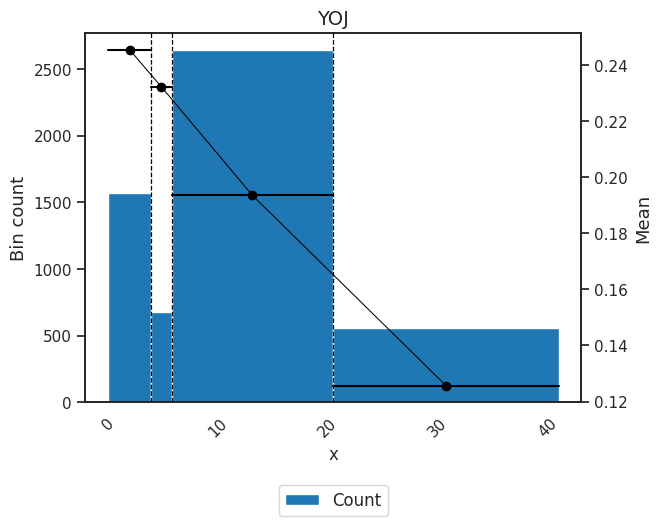


DEROG : OPTIMAL
{'Feature': 'DEROG', 'IV': 0.06824326606909598, 'Splits': [array([0.5])]}
-------------------------------------------------
OptimalBinning: Continuous Binning Table Analysis
-------------------------------------------------

  General metrics

    IV                       0.06824327
    WoE                      0.58955571
    WoE (normalized)         2.95521620
    HHI                      0.60584596
    HHI (normalized)         0.47446129
    Quality score            0.34770444

  Monotonic trend             ascending

  Significance tests

    Bin A  Bin B  t-statistic      p-value
        0      1   -16.187469 1.251346e-51



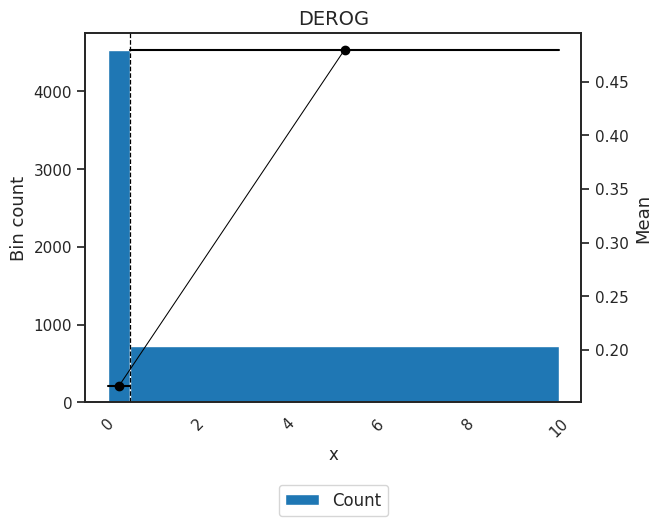


DELINQ : OPTIMAL
{'Feature': 'DELINQ', 'IV': 0.09879346651051756, 'Splits': [array([0.5, 1.5])]}
-------------------------------------------------
OptimalBinning: Continuous Binning Table Analysis
-------------------------------------------------

  General metrics

    IV                       0.09879347
    WoE                      0.84568511
    WoE (normalized)         4.23909440
    HHI                      0.52158028
    HHI (normalized)         0.40197535
    Quality score            0.45695097

  Monotonic trend             ascending

  Significance tests

    Bin A  Bin B  t-statistic      p-value
        0      1   -10.372459 1.120468e-23
        1      2    -8.211956 5.835227e-16



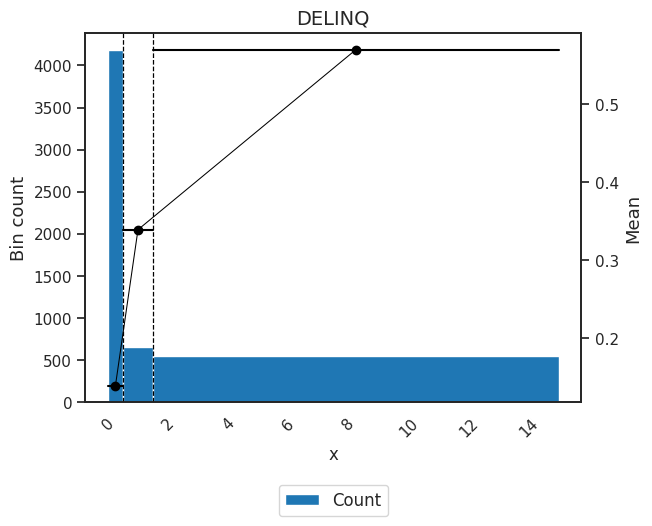


CLAGE : OPTIMAL
{'Feature': 'CLAGE', 'IV': 0.06844528399621638, 'Splits': [array([ 71.26747894,  92.41333771, 111.69284821, 172.56119537,
       188.74290466, 240.4947052 , 262.36380005])]}
-------------------------------------------------
OptimalBinning: Continuous Binning Table Analysis
-------------------------------------------------

  General metrics

    IV                       0.06844528
    WoE                      0.91373831
    WoE (normalized)         4.58021895
    HHI                      0.15084979
    HHI (normalized)         0.05649977
    Quality score            0.00542866

  Monotonic trend            descending

  Significance tests

    Bin A  Bin B  t-statistic  p-value
        0      1     3.123345 0.001866
        1      2     1.503396 0.133072
        2      3     0.155599 0.876383
        3      4     4.163399 0.000034
        4      5     0.404052 0.686273
        5      6     2.431311 0.015319
        6      7     0.283054 0.777236



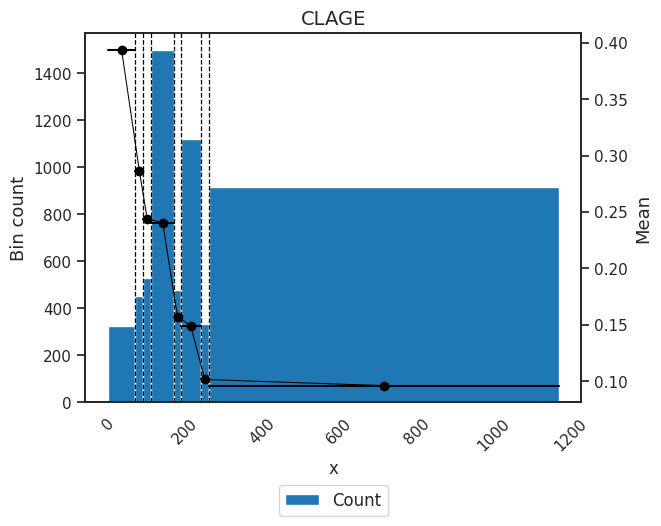


NINQ : OPTIMAL
{'Feature': 'NINQ', 'IV': 0.04993130940047745, 'Splits': [array([0.5, 1.5, 2.5, 3.5])]}
-------------------------------------------------
OptimalBinning: Continuous Binning Table Analysis
-------------------------------------------------

  General metrics

    IV                       0.04993131
    WoE                      0.64266714
    WoE (normalized)         3.22144334
    HHI                      0.26427610
    HHI (normalized)         0.14165545
    Quality score            0.49735307

  Monotonic trend             ascending

  Significance tests

    Bin A  Bin B  t-statistic  p-value
        0      1    -2.572178 0.010162
        1      2    -2.286220 0.022377
        2      3    -1.509196 0.131671
        3      4    -4.760233 0.000002



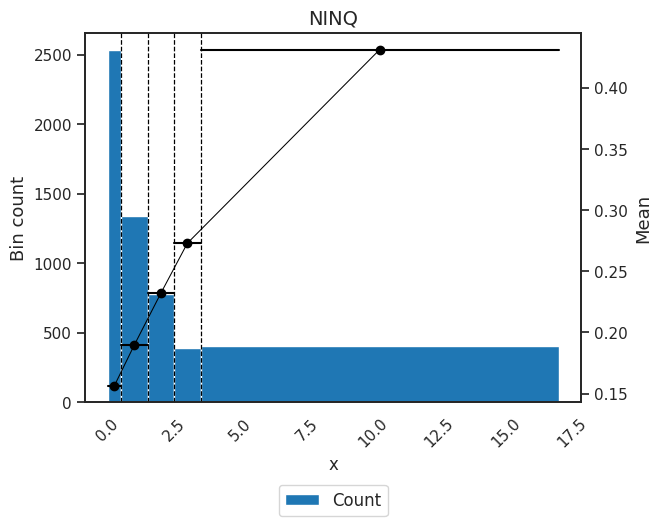


CLNO : OPTIMAL
{'Feature': 'CLNO', 'IV': 0.03568910184225935, 'Splits': [array([ 9.5, 14.5, 16.5, 20.5, 29.5, 32.5, 38.5])]}
-------------------------------------------------
OptimalBinning: Continuous Binning Table Analysis
-------------------------------------------------

  General metrics

    IV                       0.03568910
    WoE                      0.58149158
    WoE (normalized)         2.91479380
    HHI                      0.16286215
    HHI (normalized)         0.06984683
    Quality score            0.00326217

  Monotonic trend                valley

  Significance tests

    Bin A  Bin B  t-statistic      p-value
        0      1     5.781053 9.826731e-09
        1      2     1.723212 8.510817e-02
        2      3    -1.450747 1.471199e-01
        3      4    -0.427697 6.689168e-01
        4      5    -0.036643 9.707852e-01
        5      6    -1.308970 1.909634e-01
        6      7    -1.533284 1.256774e-01



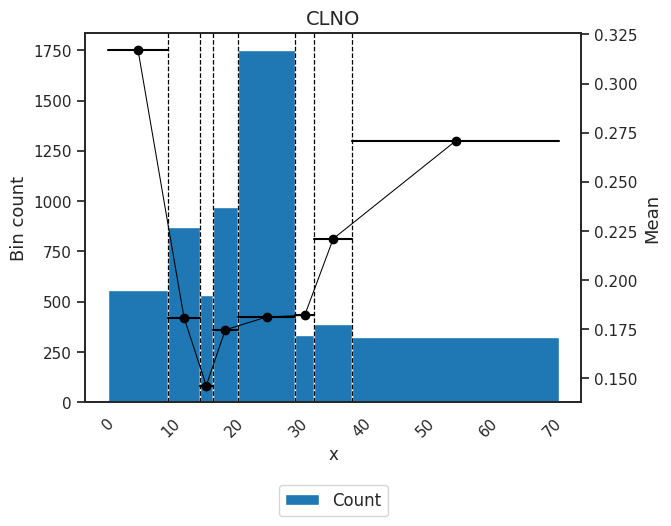


DEBTINC : OPTIMAL
{'Feature': 'DEBTINC', 'IV': 0.1987212287734787, 'Splits': [array([26.45286179, 28.63034821, 30.77528191, 34.48015213, 40.20612335,
       42.31913567])]}
-------------------------------------------------
OptimalBinning: Continuous Binning Table Analysis
-------------------------------------------------

  General metrics

    IV                       0.19872123
    WoE                      1.64471776
    WoE (normalized)         8.24433799
    HHI                      0.17006745
    HHI (normalized)         0.06632588
    Quality score            0.14754312

  Monotonic trend                valley

  Significance tests

    Bin A  Bin B  t-statistic      p-value
        0      1     0.516983 6.053516e-01
        1      2     1.517584 1.296657e-01
        2      3    -2.476343 1.343192e-02
        3      4    -0.829248 4.070904e-01
        4      5    -1.623394 1.049057e-01
        5      6    -9.787008 1.563150e-20



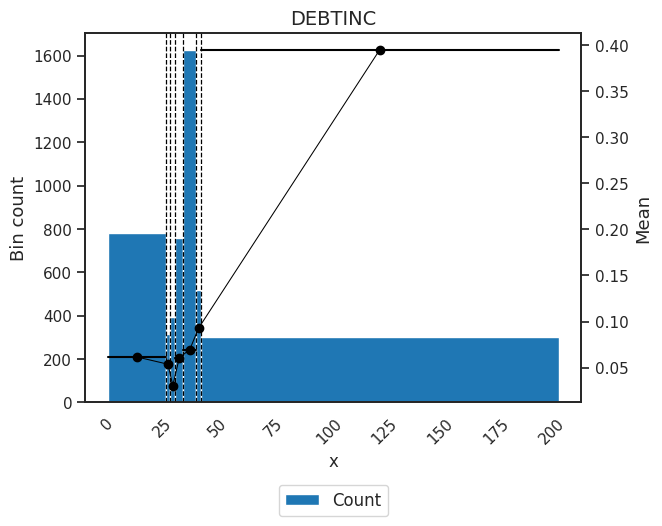

In [487]:
IV_sums = pd.DataFrame(columns=['Feature', 'IV', 'Splits'])

for col in num_features:
  #col = 'DEBTINC'
  optb = ContinuousOptimalBinning(name=col, dtype="numerical")
  optb.fit(data[col], data[target])
  print('\n' + col + ' : ' + optb.status)

  binning_table = optb.binning_table
  row = {'Feature' : col, 'IV' : binning_table.build().loc['Totals', 'IV'], 'Splits' : [optb.splits]}
  IV_sums = pd.concat([IV_sums, pd.DataFrame(row, index = [0])])
  print(row)

  binning_table.analysis()

  binning_table.plot(style="actual")

IV_sums = IV_sums.reset_index(drop=True)

In [488]:
IV_sums

,Feature,IV,Splits
0,LOAN,0.049159,"[6050.0, 10050.0, 15050.0, 17050.0, 21050.0, 2..."
1,MORTDUE,0.027662,"[35009.5, 42368.5, 59984.5, 81993.0, 124069.5]"
2,VALUE,0.053382,"[47504.0, 86410.0, 92908.0, 97974.0, 104625.5,..."
3,YOJ,0.031722,"[3.950000047683716, 5.799999952316284, 20.5]"
4,DEROG,0.068243,[0.5]
5,DELINQ,0.098793,"[0.5, 1.5]"
6,CLAGE,0.068445,"[71.2674789428711, 92.41333770751953, 111.6928..."
7,NINQ,0.049931,"[0.5, 1.5, 2.5, 3.5]"
8,CLNO,0.035689,"[9.5, 14.5, 16.5, 20.5, 29.5, 32.5, 38.5]"
9,DEBTINC,0.198721,"[26.452861785888672, 28.630348205566406, 30.77..."


Cutting continuos variables into cooarse bins

In [489]:
num_features_cat = ["cat_" + num_features for num_features in num_features]
data_cat = pd.DataFrame()

for i in range(len(IV_sums)):
  bins = list(IV_sums.at[i,'Splits'])
  bins.insert(0, 0)
  bins.insert(len(bins), np.inf)
  print('\n' + IV_sums.at[i,'Feature'])
  print(bins)

  cat_col = pd.cut(data[IV_sums.at[i,'Feature']], bins = bins, include_lowest=True)

  data_cat = pd.concat([data_cat, cat_col], axis = 1)

data_cat.columns = num_features_cat
data = pd.concat([data, data_cat], axis = 1)


LOAN
[0, 6050.0, 10050.0, 15050.0, 17050.0, 21050.0, 25050.0, 27650.0, 37950.0, inf]

MORTDUE
[0, 35009.5, 42368.5, 59984.5, 81993.0, 124069.5, inf]

VALUE
[0, 47504.0, 86410.0, 92908.0, 97974.0, 104625.5, 124946.0, 202928.0, inf]

YOJ
[0, 3.950000047683716, 5.799999952316284, 20.5, inf]

DEROG
[0, 0.5, inf]

DELINQ
[0, 0.5, 1.5, inf]

CLAGE
[0, 71.2674789428711, 92.41333770751953, 111.6928482055664, 172.56119537353516, 188.74290466308594, 240.4947052001953, 262.3638000488281, inf]

NINQ
[0, 0.5, 1.5, 2.5, 3.5, inf]

CLNO
[0, 9.5, 14.5, 16.5, 20.5, 29.5, 32.5, 38.5, inf]

DEBTINC
[0, 26.452861785888672, 28.630348205566406, 30.77528190612793, 34.48015213012695, 40.20612335205078, 42.319135665893555, inf]


In [490]:
num_features_cat = ["cat_" + num_features for num_features in num_features]
cat_features = cat_features + num_features_cat

## Train Test Split

In [491]:
X = data[cat_features]
y = data[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

## Preliminary Feature Importance
Feature importance before splitting cattegories into dummy variables ("dummifying")

In [492]:
feature_importance_cat = pd.DataFrame()

### IV

In [493]:
df_woe_iv = (pd.crosstab(data[cat_features[0]],data[target],
                      normalize='columns')
             .assign(woe=lambda dfx: np.log(dfx[1] / dfx[0]))
             .assign(iv=lambda dfx: np.sum(dfx['woe']*
                                           (dfx[1]-dfx[0]))))

REASON_IV = df_woe_iv['iv'].sum()

In [494]:
df_woe_iv = (pd.crosstab(data[cat_features[1]],data[target],
                      normalize='columns')
             .assign(woe=lambda dfx: np.log(dfx[1] / dfx[0]))
             .assign(iv=lambda dfx: np.sum(dfx['woe']*
                                           (dfx[1]-dfx[0]))))

JOB_IV = df_woe_iv['iv'].sum()

In [495]:
feature_importance_cat = pd.DataFrame()
feature_importance_cat['feature'] = cat_features
feature_importance_cat['IV'] = pd.concat([pd.DataFrame([REASON_IV, JOB_IV]), IV_sums['IV']]).reset_index(drop = True)

based on 0.04 IV level `REASON`, `cat_MORTDUE`, `cat_YOJ` and `cat_CLNO` should be removed from further analysis

However based on expert judgement is seems unreasonable to remove `cat_MORTDUE` (Amount due on existing mortgage) and `REASON` (motivation for given credit line, could be either debt consolidation or home improvement)

`cat_YOJ` and `cat_CLNO` are close to 0.04 level, and might be found significant in further analysis.

Therefore based on Information value we will not remove any features yet.

In [496]:
feature_importance_cat[feature_importance_cat['IV'] <= 0.04]

,feature,IV
0,REASON,0.017685
3,cat_MORTDUE,0.027662
5,cat_YOJ,0.031722
10,cat_CLNO,0.035689


## Dummify

converting all categorial features into dummy features
reason being thet dummy features are able to capture non-linear and non-ordinal relationships in categories

Example of non-linear relationship could be education. If we encode Elementary, High and University education as 0, 1, 2, we implicitly assume that University is twice as much better (or worse) than High School. 

However this might not be the case. Thus creating dummy feature for each allows us to capture relationship where University if 2.69 times better (or worse) than High School.

In [497]:
data_dummy = pd.concat([data[target],pd.get_dummies(data[cat_features], dummy_na = True)], axis = 1)
data_dummy

,BAD,REASON_DebtCon,REASON_HomeImp,REASON_nan,JOB_Mgr,JOB_Office,JOB_Other,JOB_ProfExe,JOB_Sales,JOB_Self,...,"cat_CLNO_(38.5, inf]",cat_CLNO_nan,"cat_DEBTINC_(-0.001, 26.453]","cat_DEBTINC_(26.453, 28.63]","cat_DEBTINC_(28.63, 30.775]","cat_DEBTINC_(30.775, 34.48]","cat_DEBTINC_(34.48, 40.206]","cat_DEBTINC_(40.206, 42.319]","cat_DEBTINC_(42.319, inf]",cat_DEBTINC_nan
0,1,0,1,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1,1,0,1,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2,1,0,1,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,1,0,0,1,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,1
4,0,0,1,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5955,0,1,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,1,0,0,0
5956,0,1,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,1,0,0,0
5957,0,1,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,1,0,0,0
5958,0,1,0,0,0,0,1,0,0,0,...,0,0,0,0,0,1,0,0,0,0


In [498]:
len(data_dummy.columns)

81

# Feature Importance

## Train test split dummy dataset

In [499]:
dummy_features = [e for e in data_dummy.columns.tolist() if e not in target]

X = data_dummy[dummy_features]
y = data_dummy[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

## X^2 Test

testing feature importance based on $𝒳^2$ test

at 5% level $𝒳^2$ test assumes to remove below listed variables

In [500]:
from sklearn.feature_selection import chi2
scores, pvalues = chi2(X, y)

p_values_df = pd.concat([pd.DataFrame(list(X.columns)),pd.DataFrame(pvalues)],axis = 1)
p_values_df.columns = ['column', 'p_value']
p_values_df[p_values_df['p_value'] >= 0.05]

,column,p_value
0,REASON_DebtCon,0.123052
2,REASON_nan,0.720099
12,"cat_LOAN_(10050.0, 15050.0]",0.616856
18,"cat_LOAN_(37950.0, inf]",0.050568
22,"cat_MORTDUE_(42368.5, 59984.5]",0.315919
23,"cat_MORTDUE_(59984.5, 81993.0]",0.151445
25,"cat_MORTDUE_(124069.5, inf]",0.059970
26,cat_MORTDUE_nan,0.467893
28,"cat_VALUE_(47504.0, 86410.0]",0.271596
34,"cat_VALUE_(202928.0, inf]",0.606832


## Univariate GINI

In [501]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


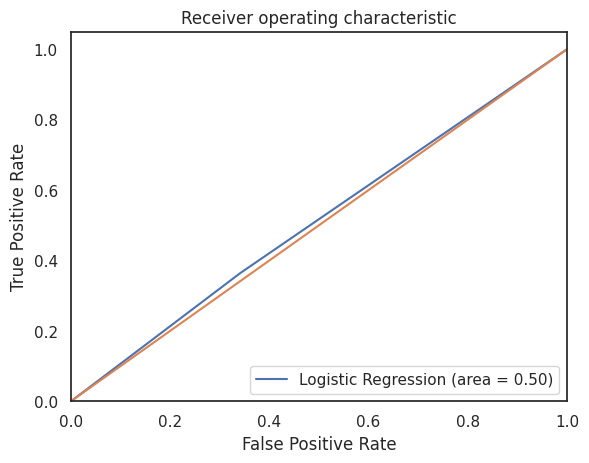

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


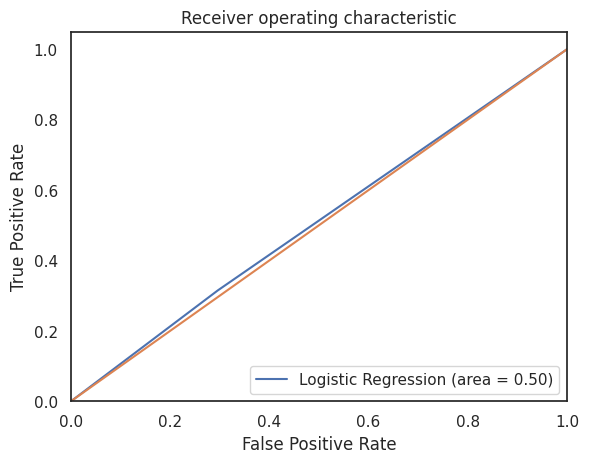

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


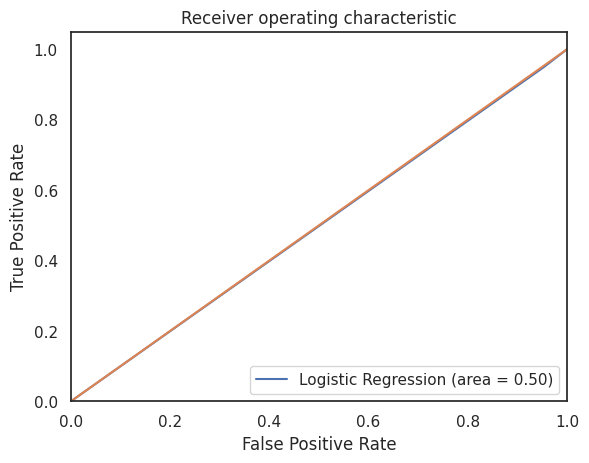

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


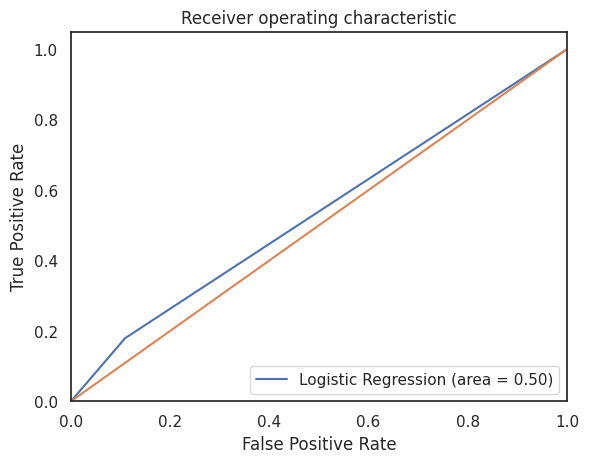

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


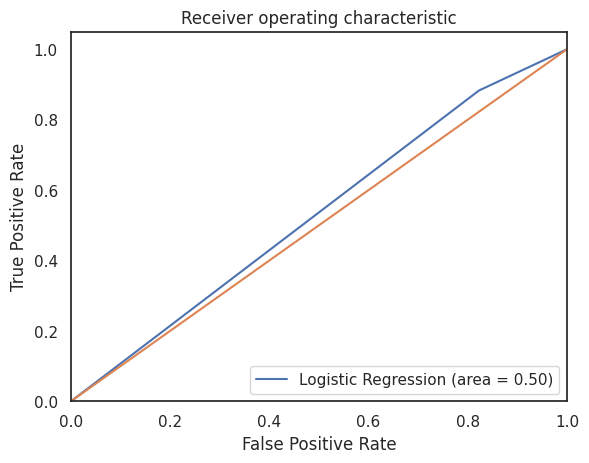

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


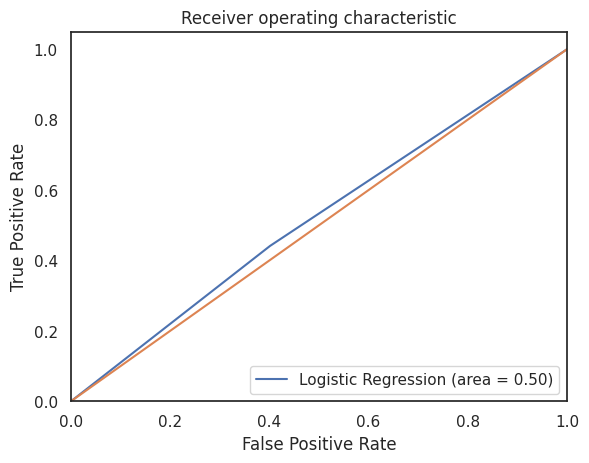

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


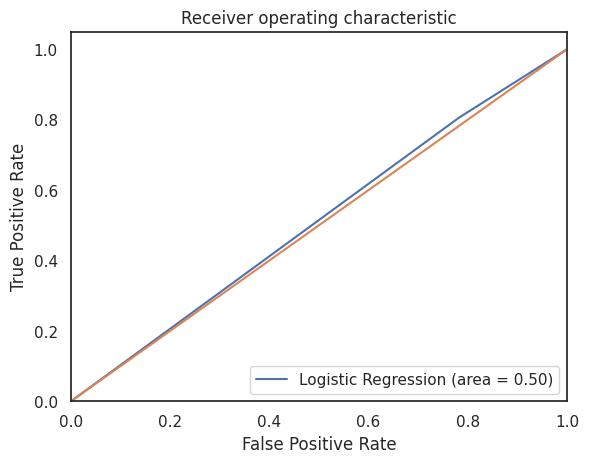

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


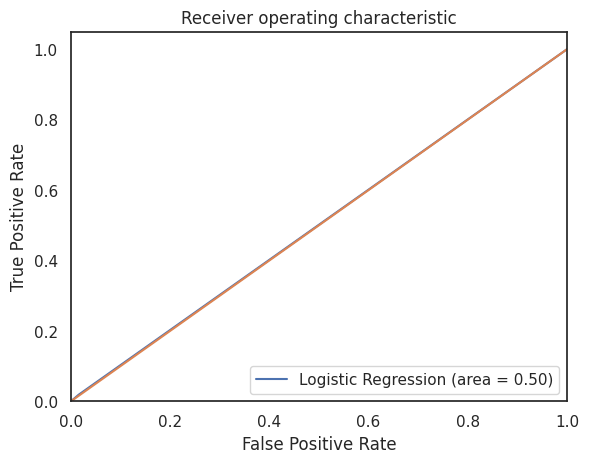

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


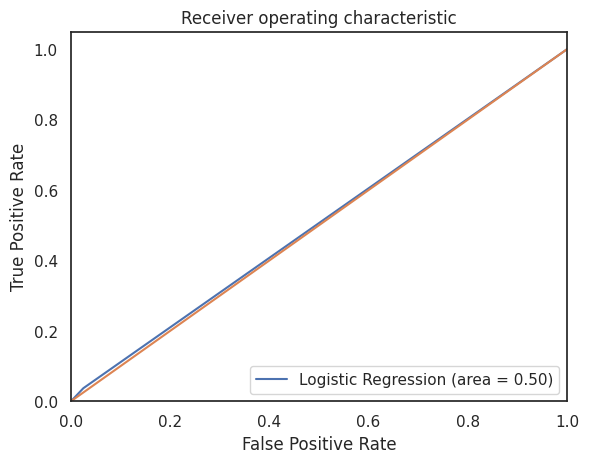

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


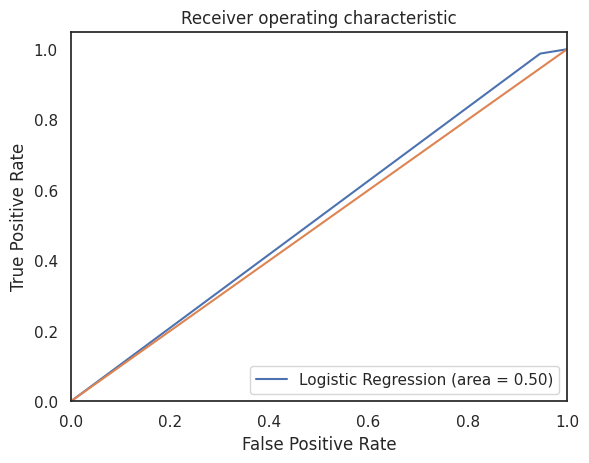

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


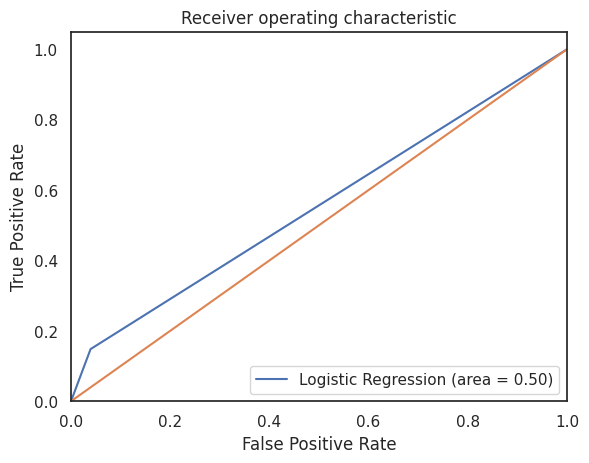

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


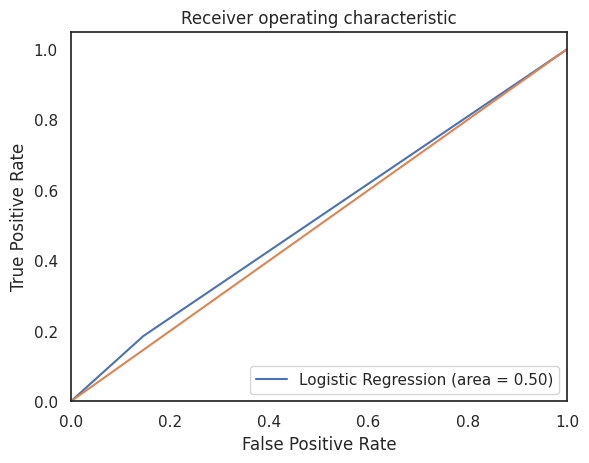

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


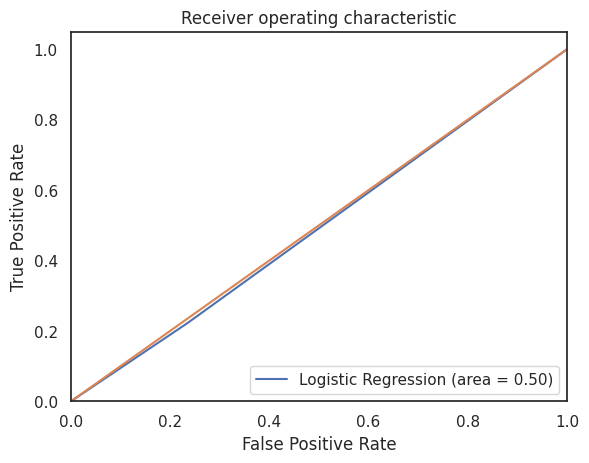

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


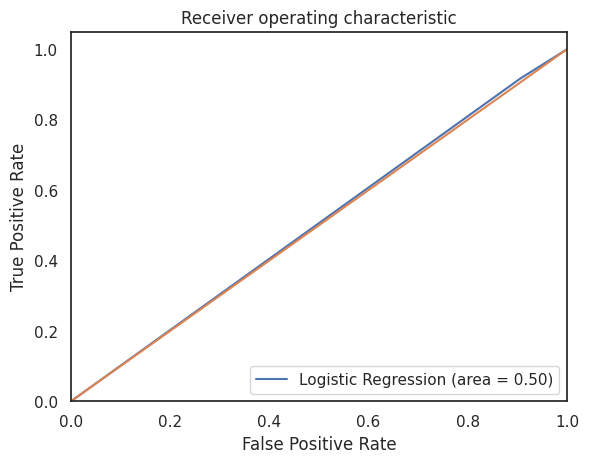

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


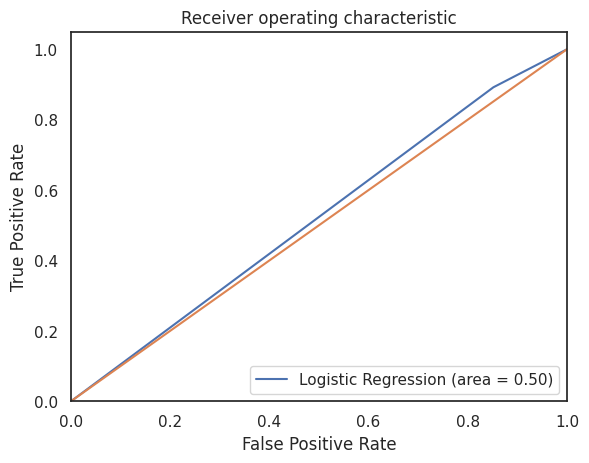

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


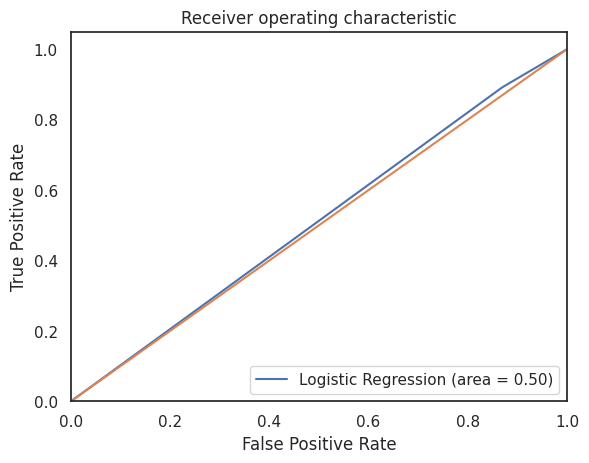

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


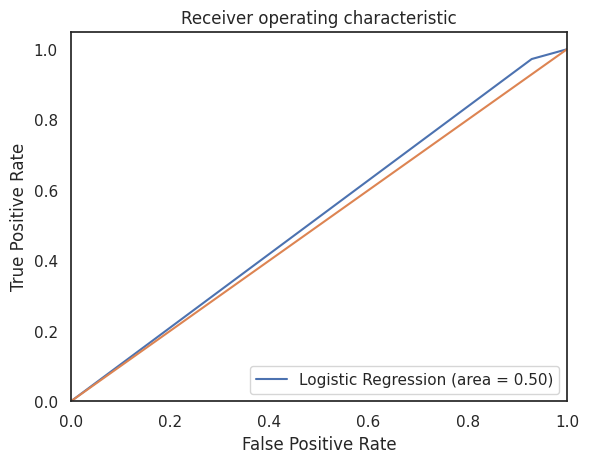

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


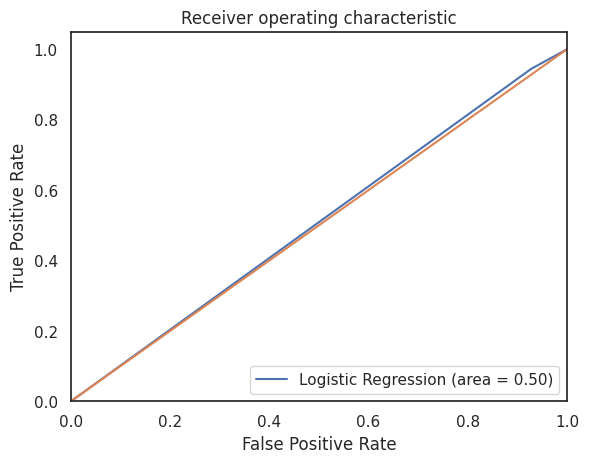

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


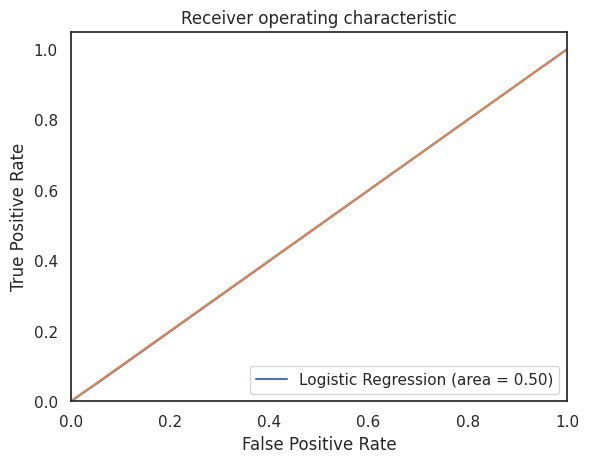

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


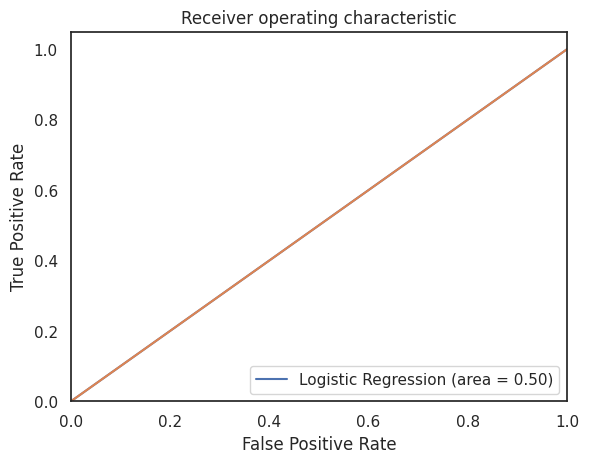

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


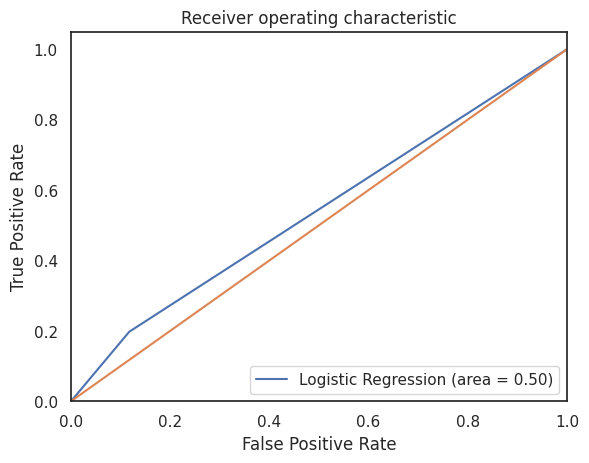

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


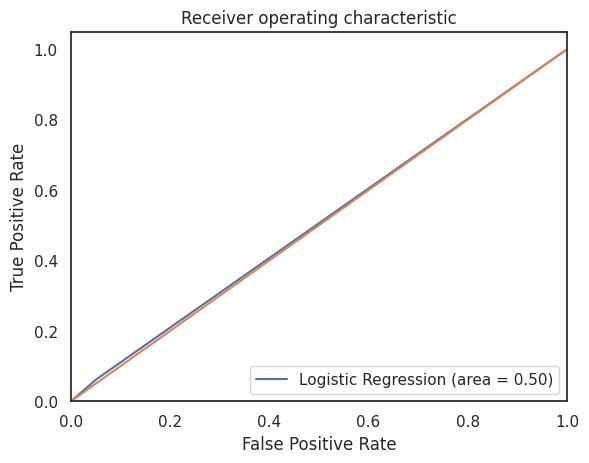

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


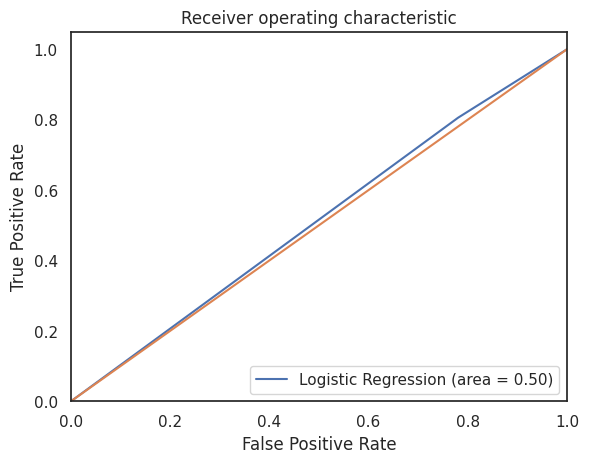

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


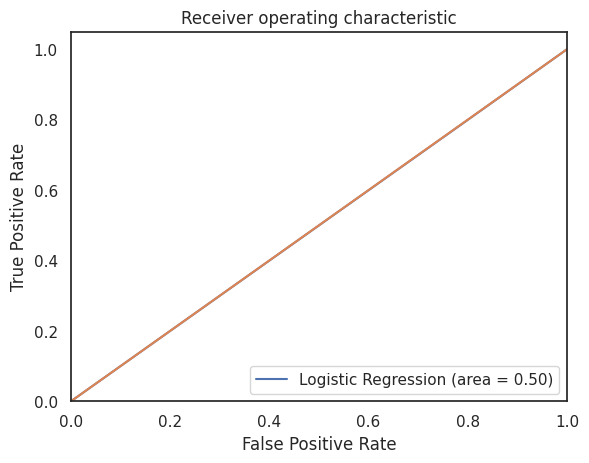

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


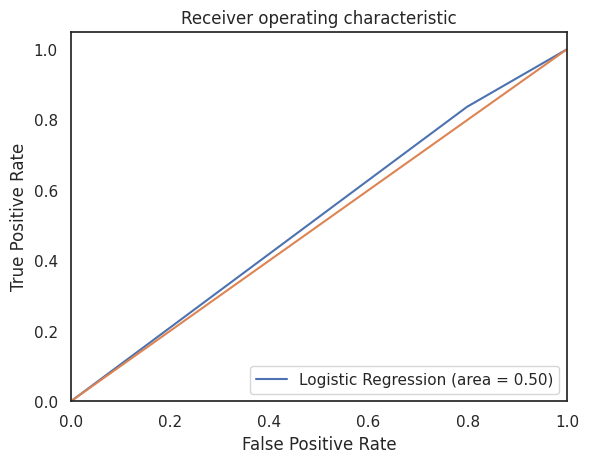

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


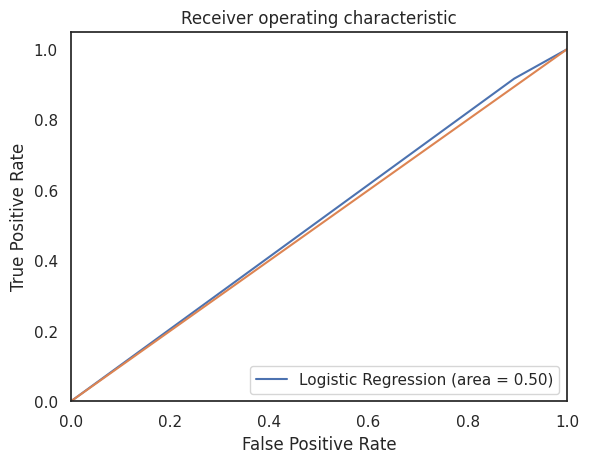

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


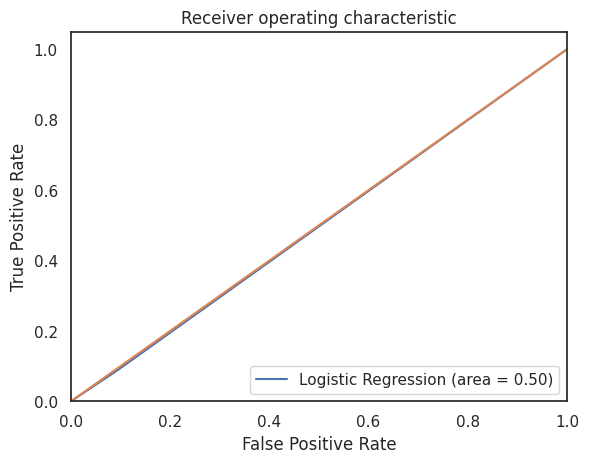

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


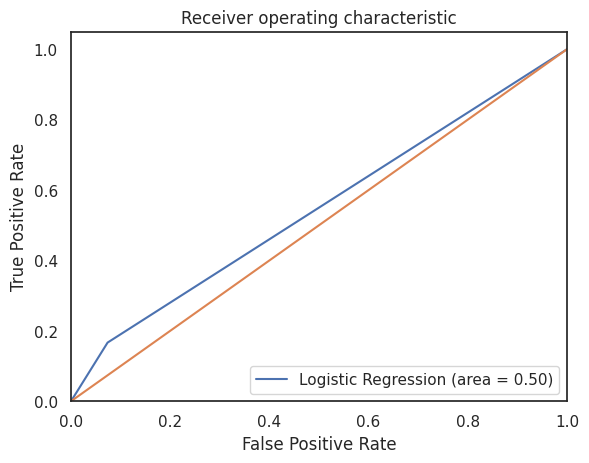

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


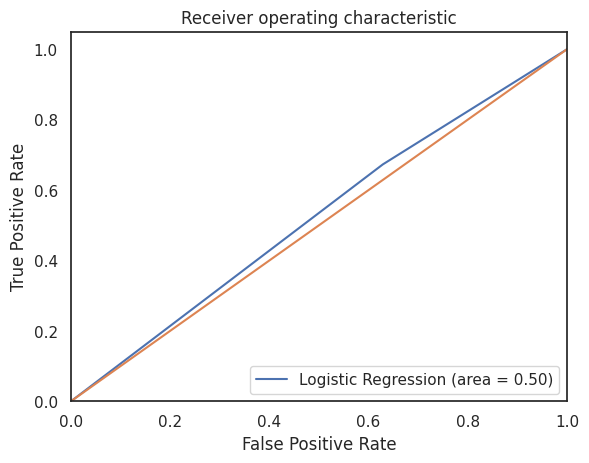

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


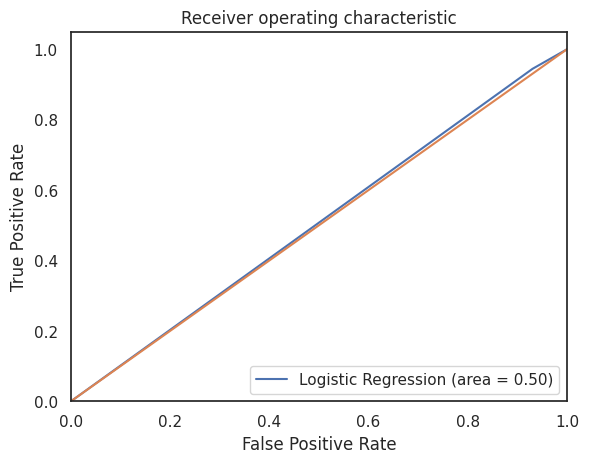

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


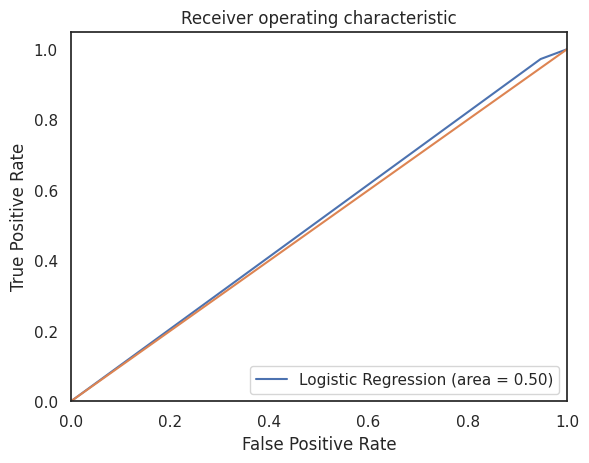

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


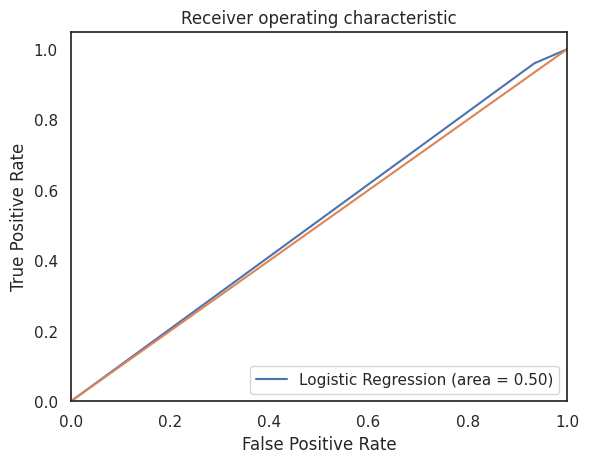

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


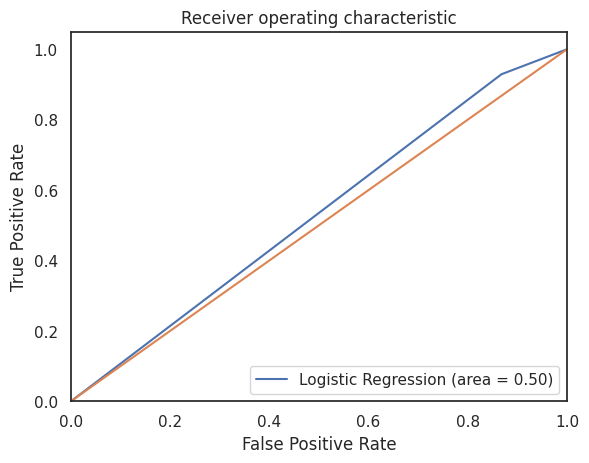

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


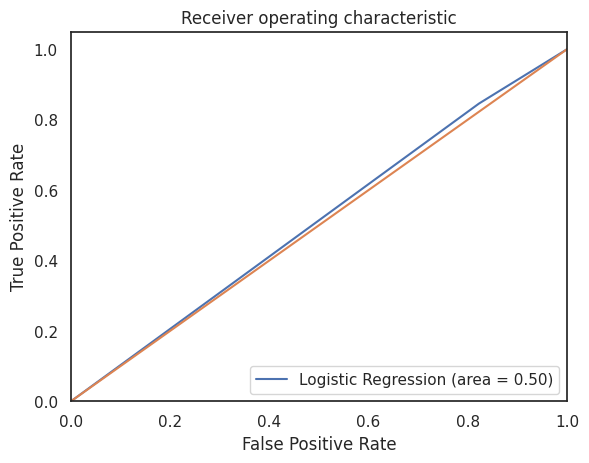

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


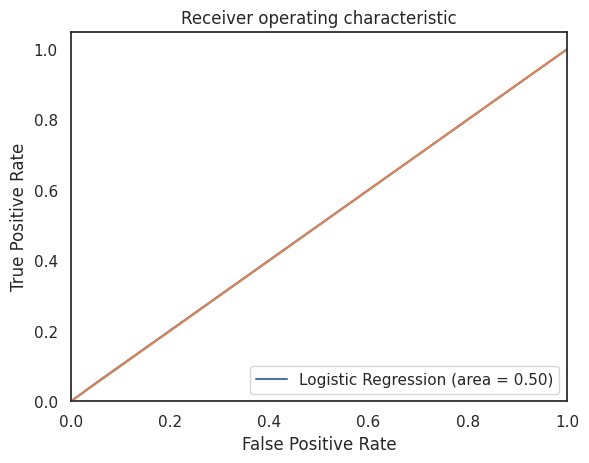

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


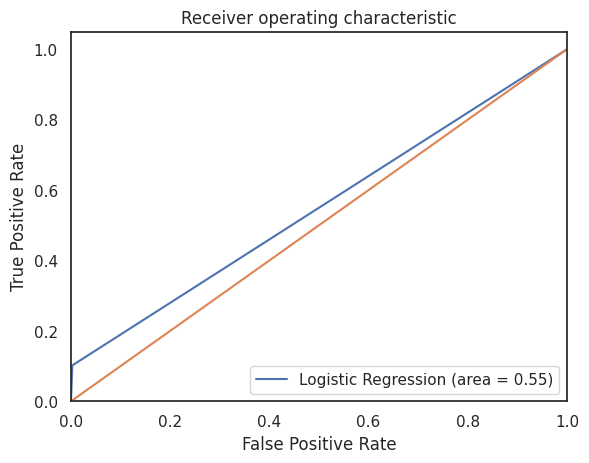

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


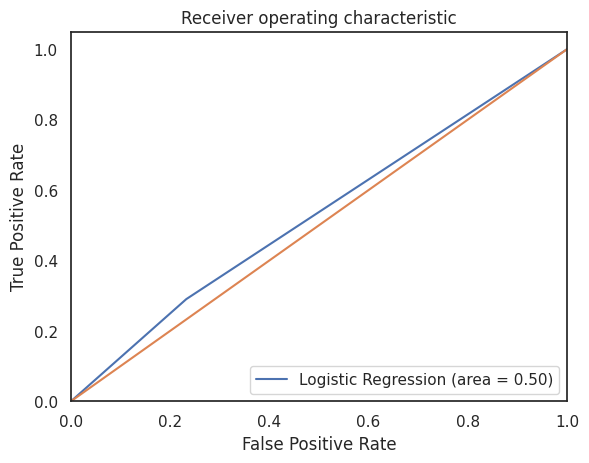

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


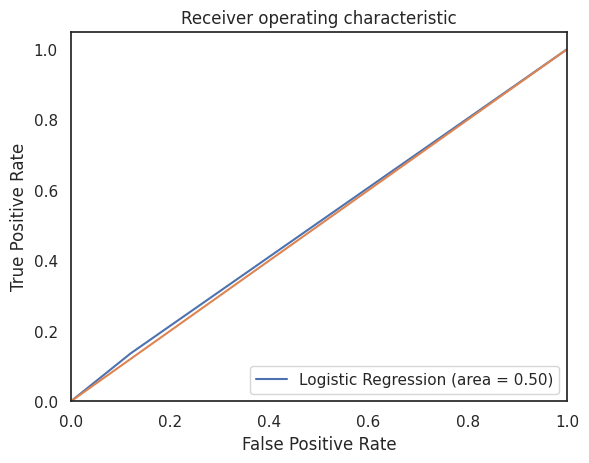

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


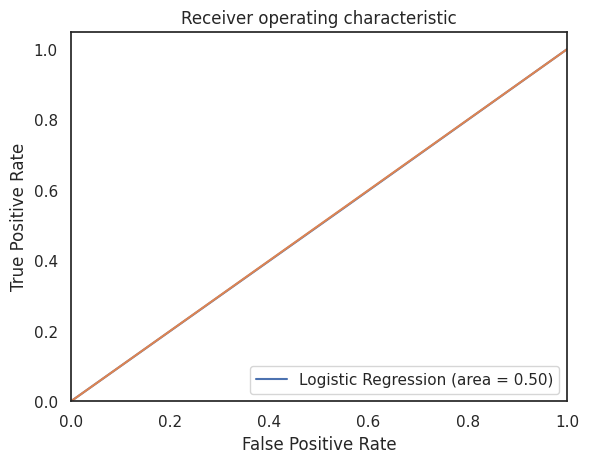

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


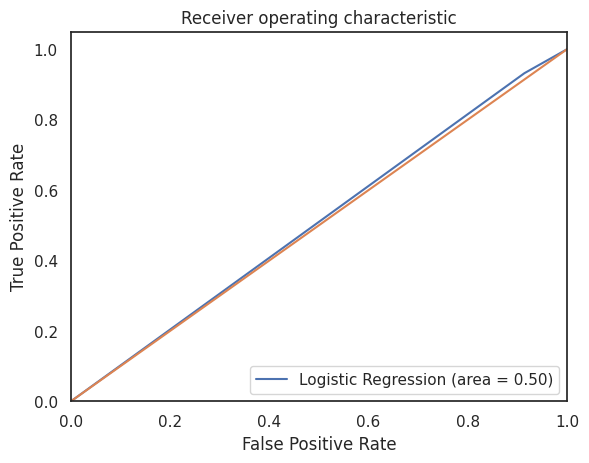

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


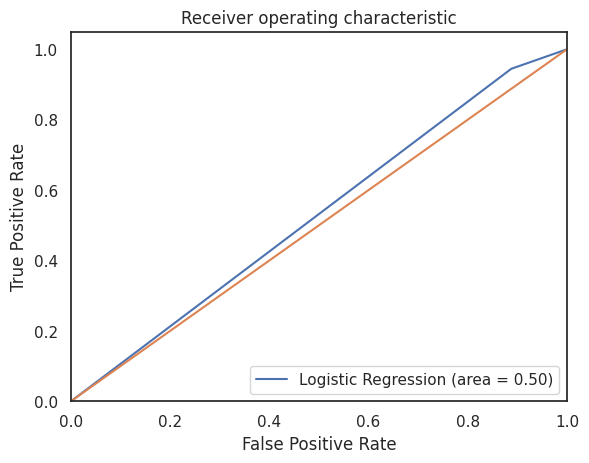

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


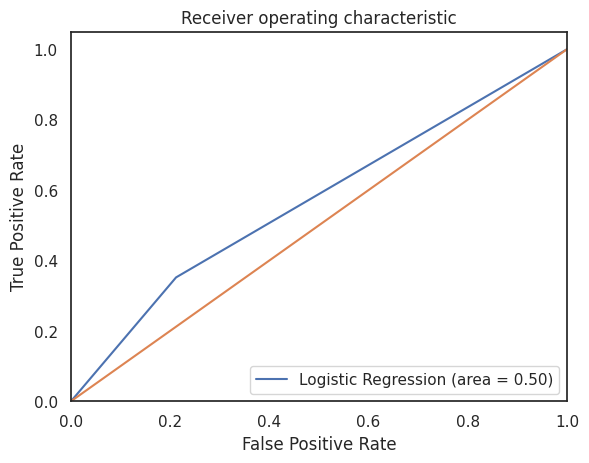

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


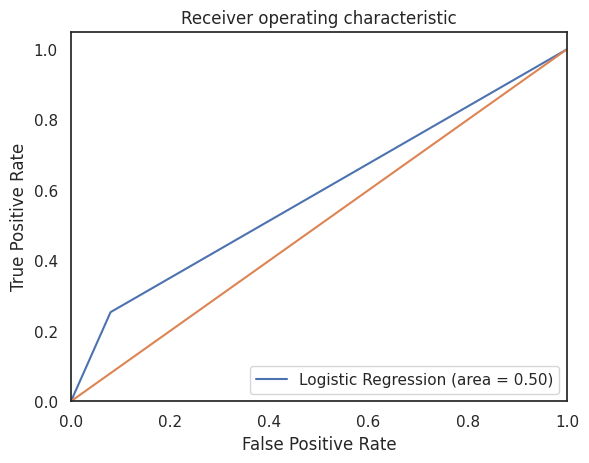

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


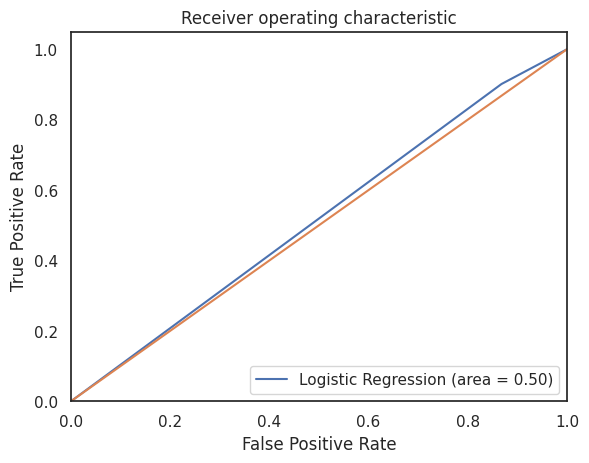

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


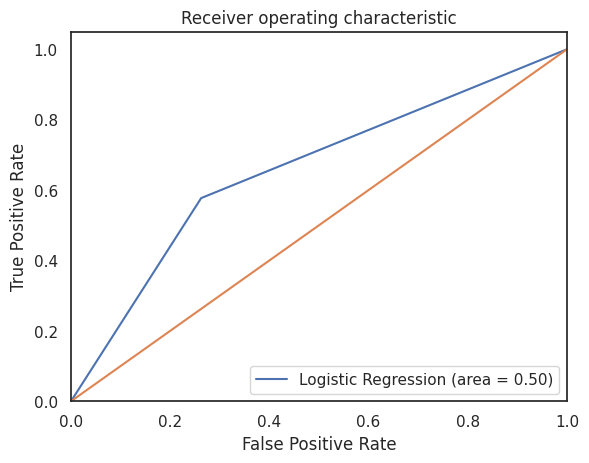

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


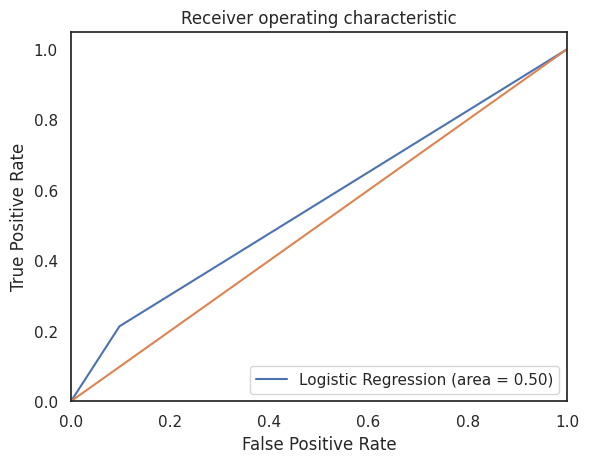

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


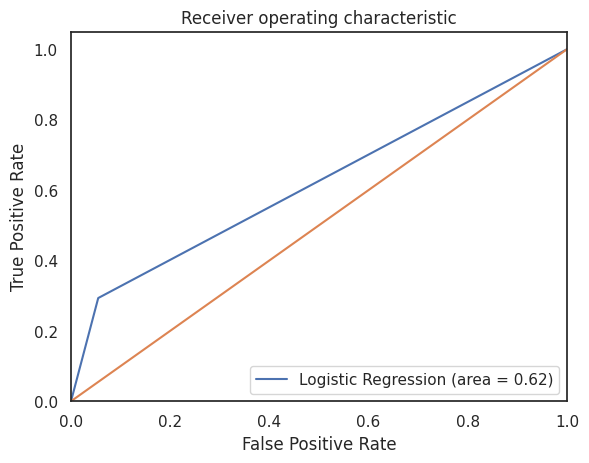

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


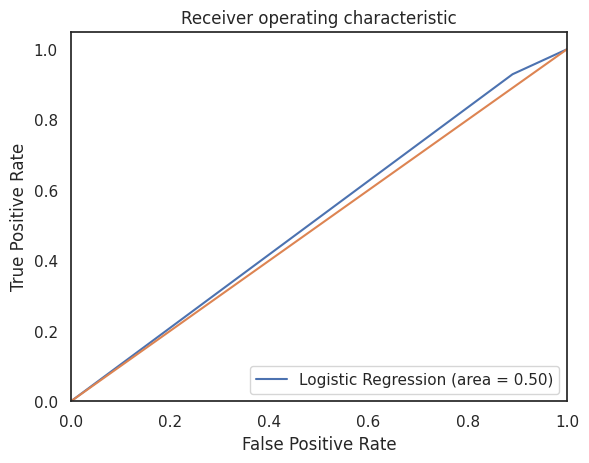

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


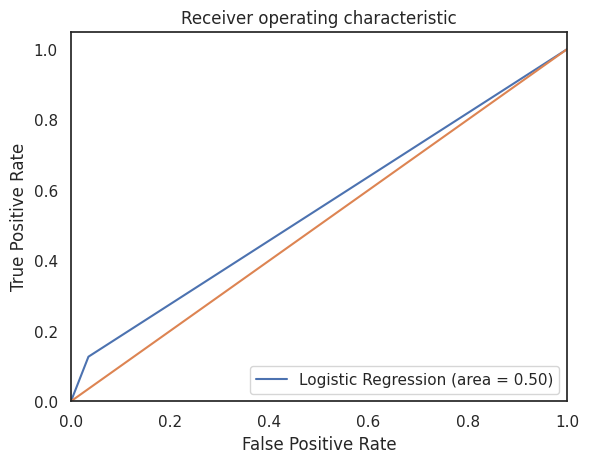

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


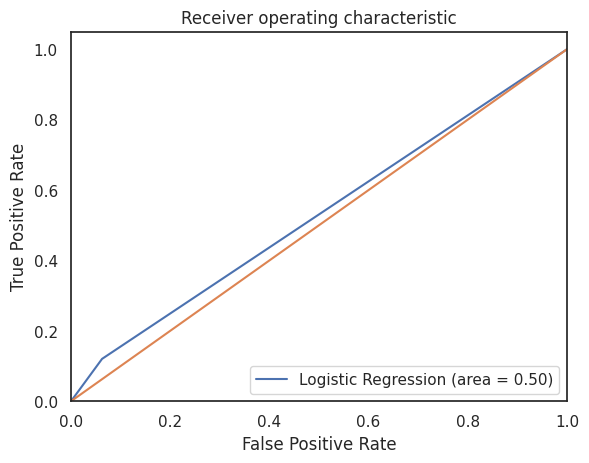

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


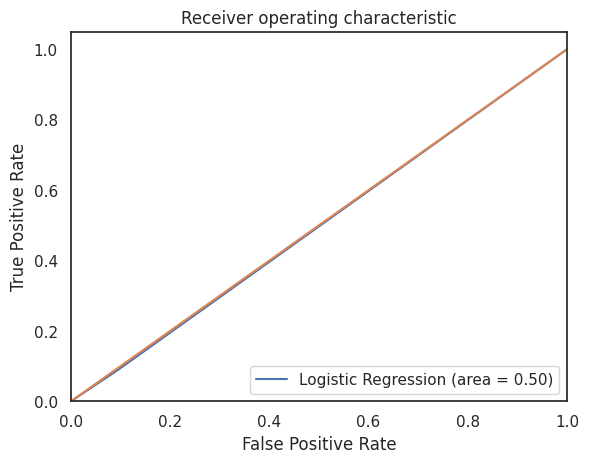

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


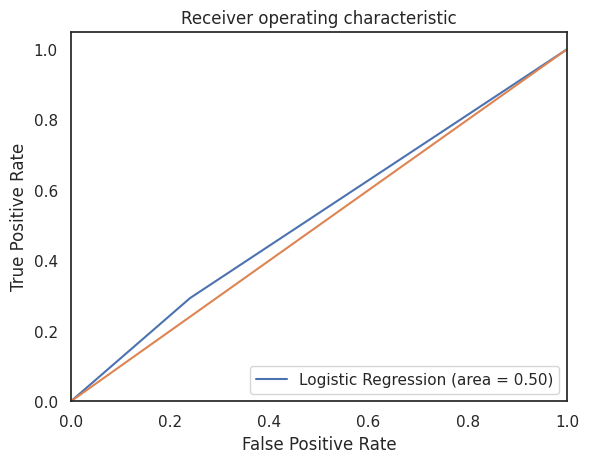

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


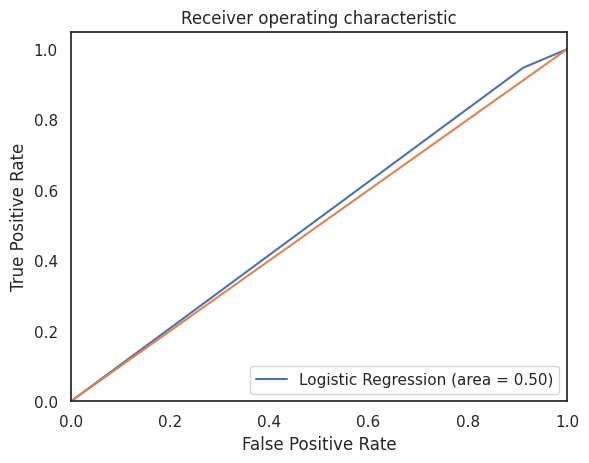

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


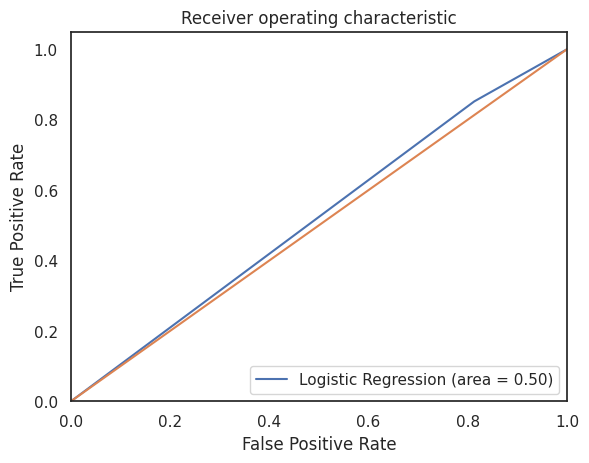

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


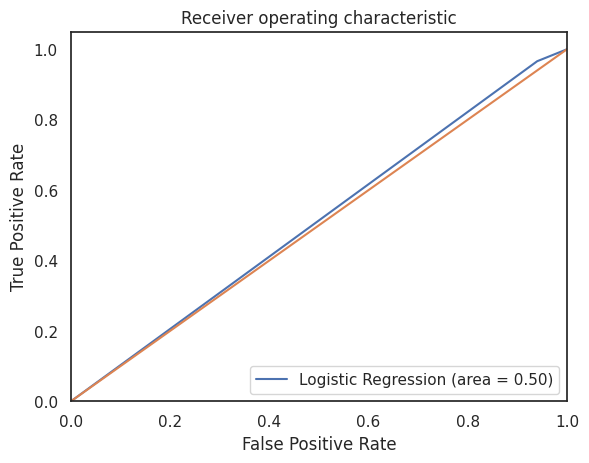

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


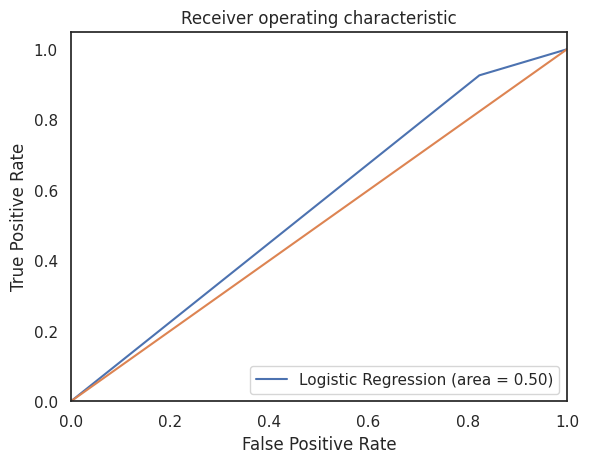

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


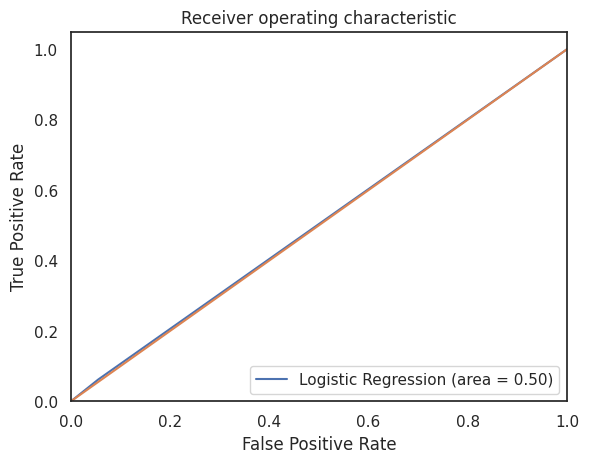

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


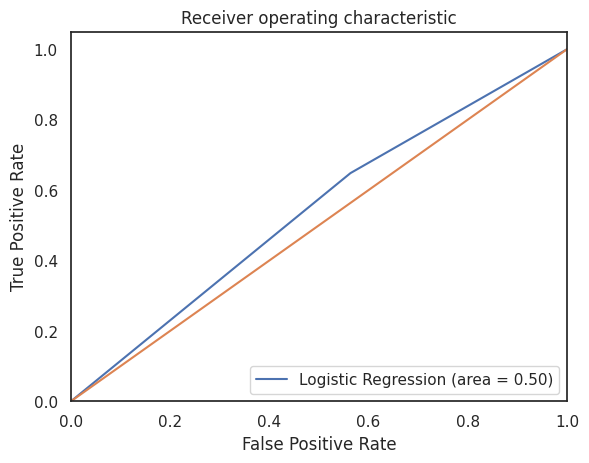

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


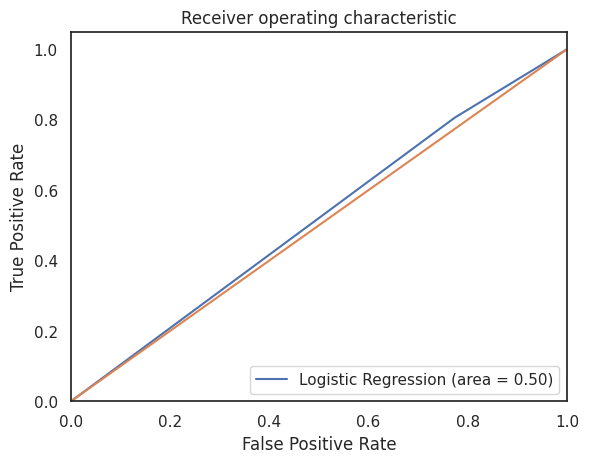

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


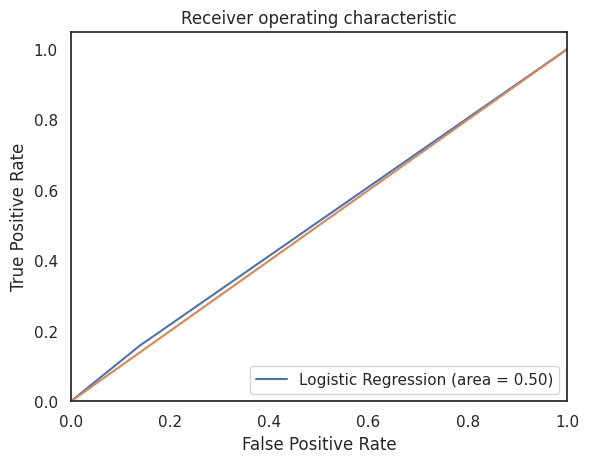

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


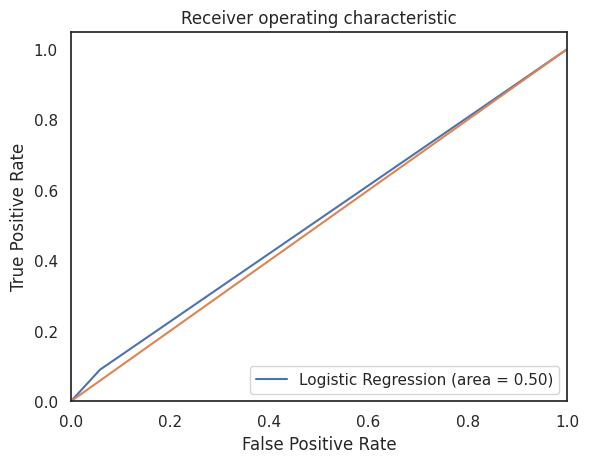

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


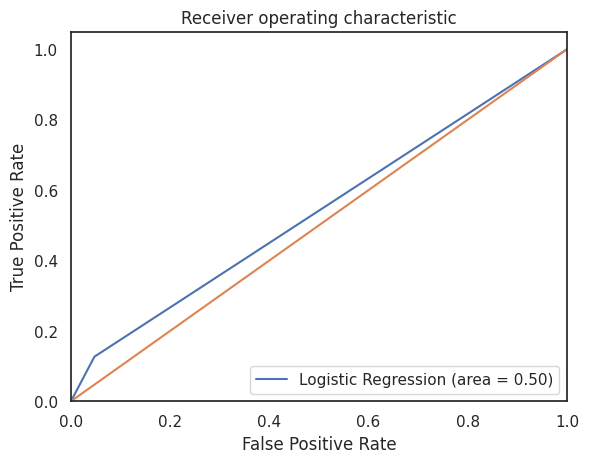

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


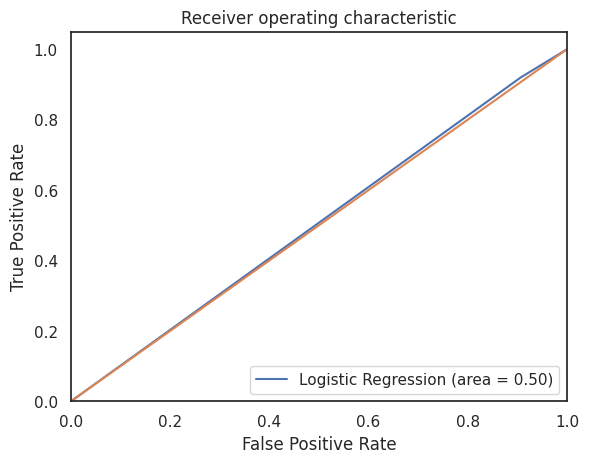

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


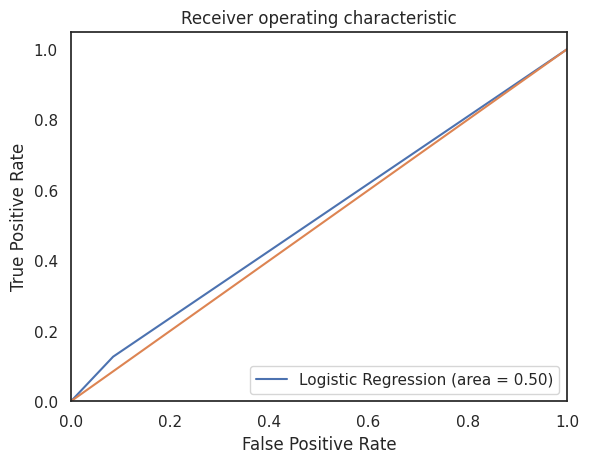

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


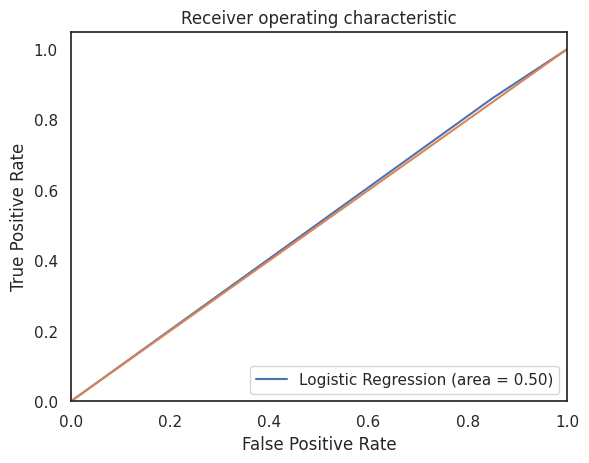

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


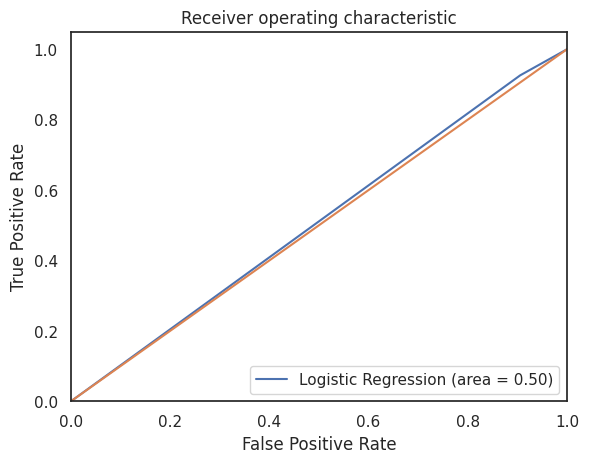

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


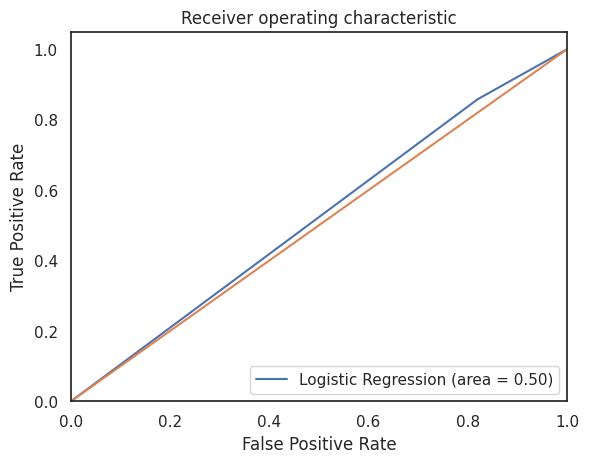

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


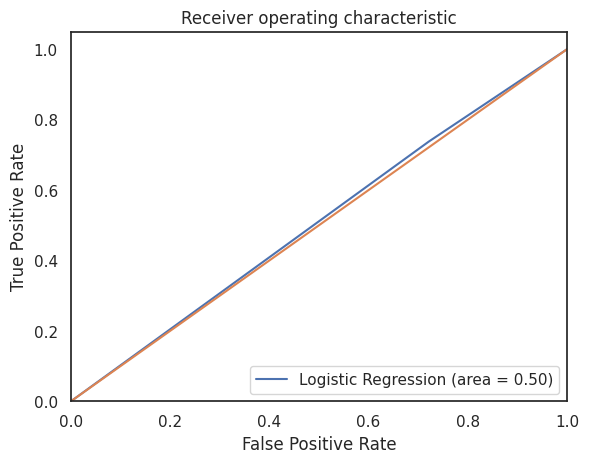

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


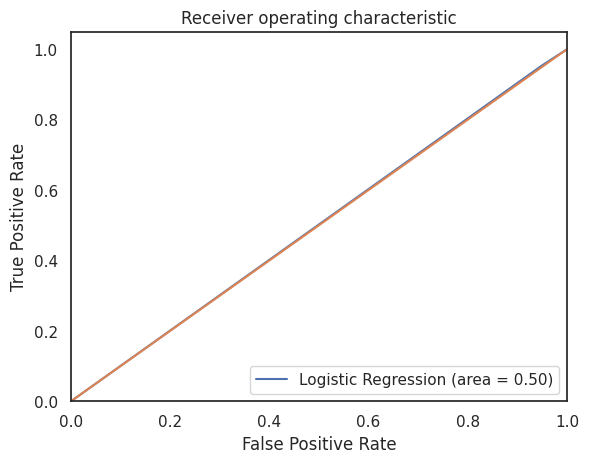

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


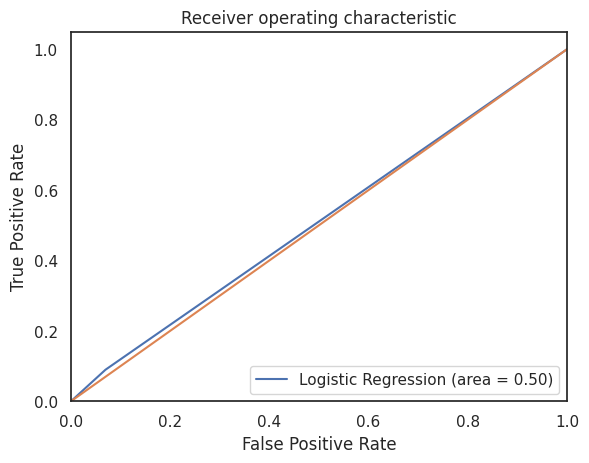

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


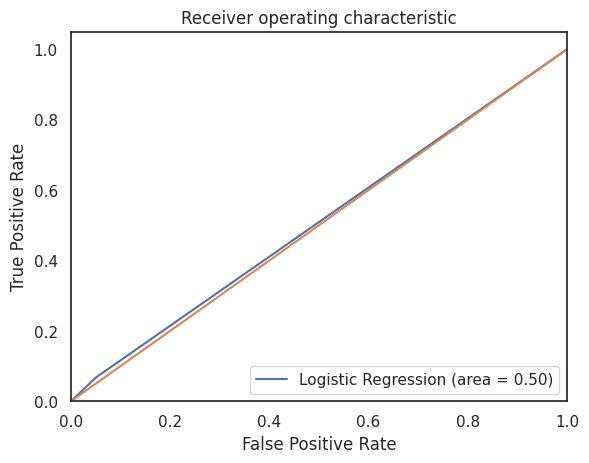

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


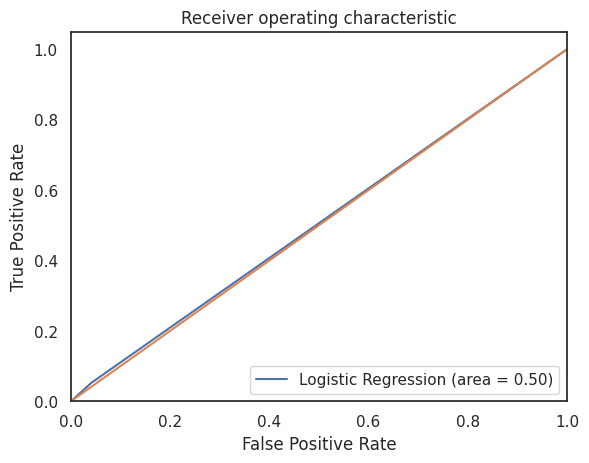

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


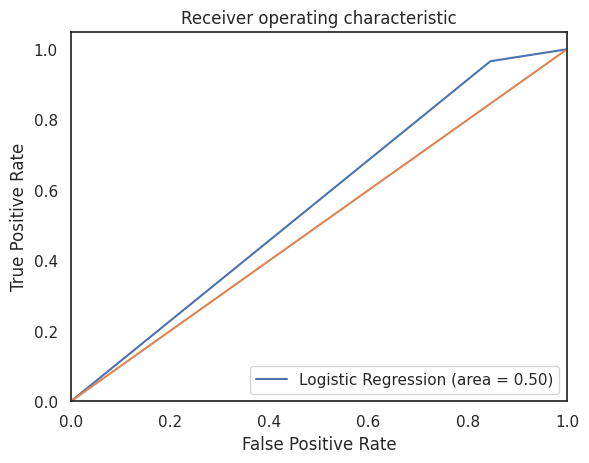

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


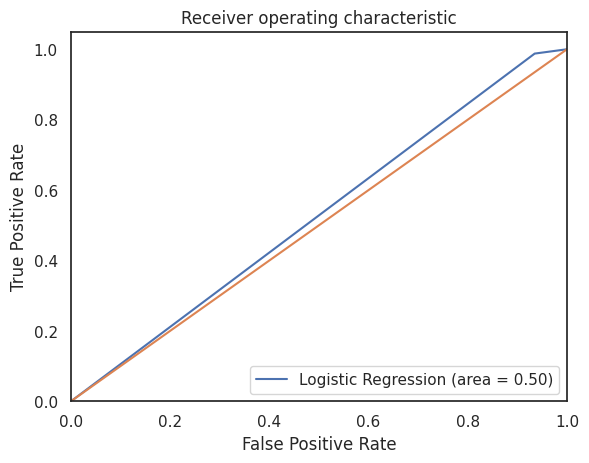

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


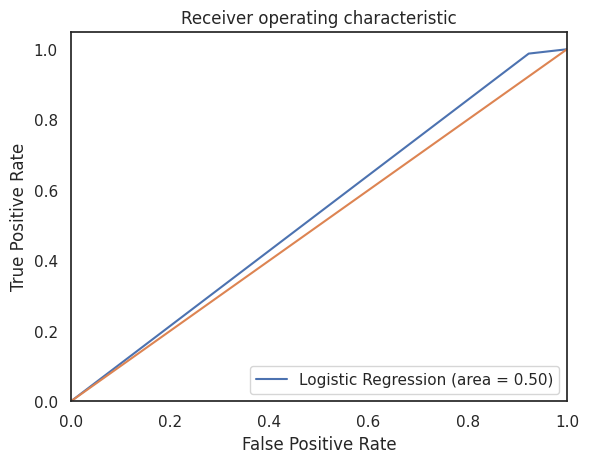

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


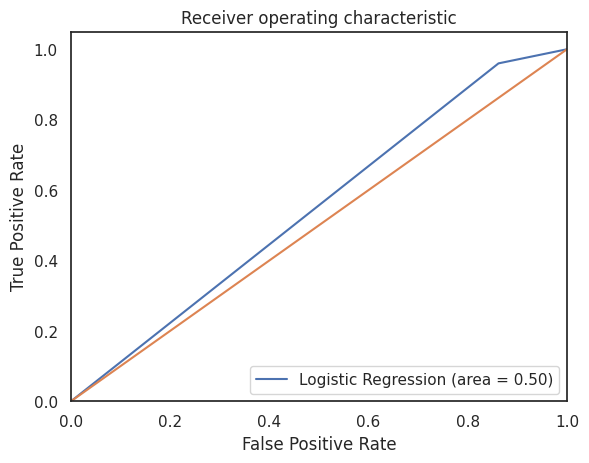

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


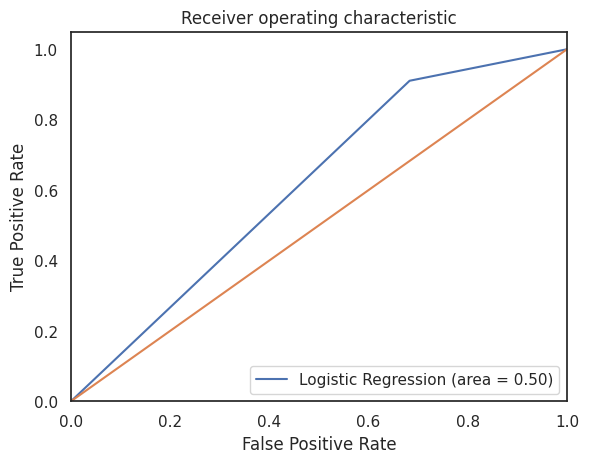

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


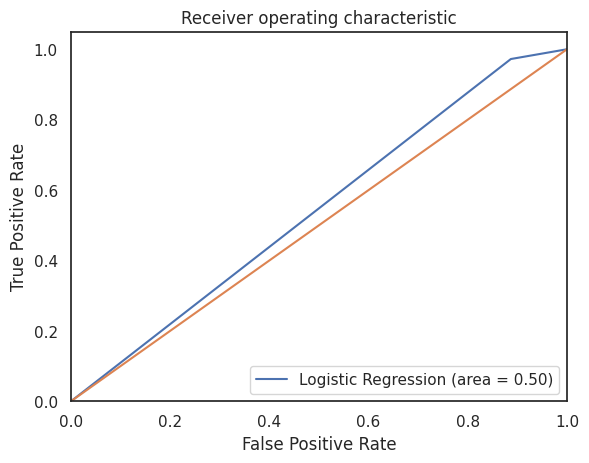

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


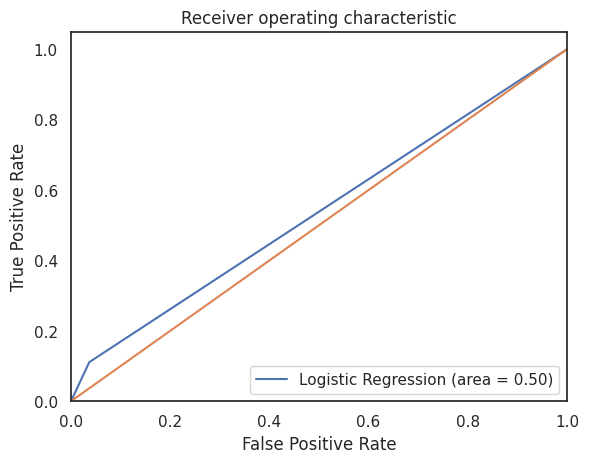

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


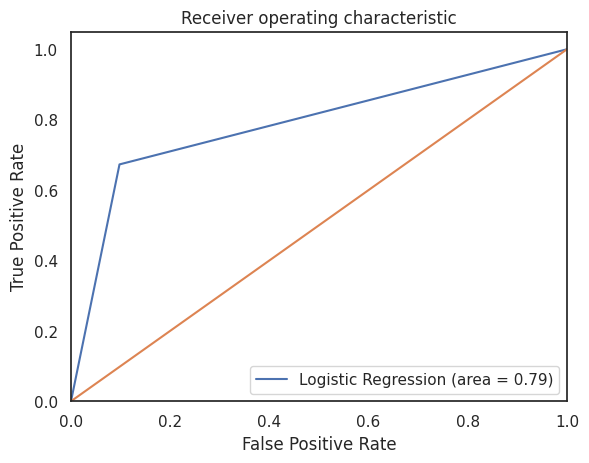

In [502]:
univariate_GINI_logit = pd.DataFrame(columns = ['Feature', 'AUC', 'GINI'])

for col in dummy_features:
  #col = 'REASON_DebtCon'
  y_train_univariate = np.reshape(y_train.to_numpy(), (len(y_train.to_numpy()), -1))
  x_train_univariate = np.reshape(X_train[col].to_numpy(), (len(X_train[col].to_numpy()), -1))
  x_test_univariate = np.reshape(X_test[col].to_numpy(), (len(X_test[col].to_numpy()), -1))

  logit = LogisticRegression()
  logit.fit(x_train_univariate, y_train_univariate)
  logit_roc_auc = roc_auc_score(y_test, logit.predict(x_test_univariate))

  row = {'Feature' : col, 'AUC' : logit_roc_auc, 'GINI' : (logit_roc_auc*2)-1}

  univariate_GINI_logit = pd.concat([univariate_GINI_logit, pd.DataFrame(row, index = [0])])

  fpr, tpr, thresholds = roc_curve(y_test, logit.predict_proba(x_test_univariate)[:,1])
  plt.figure()
  plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
  plt.plot([0, 1], [0, 1])
  plt.xlim([0.0, 1.0])
  plt.ylim([0.0, 1.05])
  plt.xlabel('False Positive Rate')
  plt.ylabel('True Positive Rate')
  plt.title('Receiver operating characteristic')
  plt.legend(loc='lower right')
  plt.savefig('Log_ROC')
  plt.show()

univariate GINI based on Logistic Regression proposes selection of only 3 features: `cat_VALUE_nan`, `cat_DELINQ_(1.5, inf]` and `cat_DEBTINC_nan`

In [503]:
univariate_GINI_logit[univariate_GINI_logit['GINI']>0]

,Feature,AUC,GINI
0,cat_VALUE_nan,0.549639,0.099279
0,"cat_DELINQ_(1.5, inf]",0.619161,0.238321
0,cat_DEBTINC_nan,0.787535,0.575069


This selection is confirmed by $X^2$ test

In [504]:
p_values_df[p_values_df['column'].isin(['cat_VALUE_nan', 'cat_DELINQ_(1.5, inf]', 'cat_DEBTINC_nan'])]

,column,p_value
35,cat_VALUE_nan,4.621503e-85
46,"cat_DELINQ_(1.5, inf]",1.788125e-104
79,cat_DEBTINC_nan,1.487930e-307


## Sequential Feature Selection

Since univariate GINI selection seems too narrow, Sequantial Feature Selection (SFS) will be used as well.

SFS is iterating through the list of features and eith adding features to the model based on their importance (Forwards SFS), or removing features from all of the features based on identical principle (Backwards SFS)

for more detail please see [documentation](https://rasbt.github.io/mlxtend/user_guide/feature_selection/SequentialFeatureSelector/)

In [505]:
import joblib
import sys
sys.modules['sklearn.externals.joblib'] = joblib
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs

In [506]:
logit_sfs = LogisticRegression()
sfs = SFS(
    logit_sfs,
    k_features = 10, 
    forward=True, 
    floating=False,
    cv=5
    )
sfs.fit(X_train, y_train)

selected_features = list(sfs.k_feature_names_)
selected_features

['JOB_Office',
 'JOB_nan',
 'cat_VALUE_nan',
 'cat_DEROG_(0.5, inf]',
 'cat_DELINQ_(1.5, inf]',
 'cat_CLAGE_(188.743, 240.495]',
 'cat_CLAGE_(240.495, 262.364]',
 'cat_CLAGE_(262.364, inf]',
 'cat_DEBTINC_(42.319, inf]',
 'cat_DEBTINC_nan']

Based on Forward SFS we selected 10 variables with highest impact on model performance.

Forward SFS nicely showcases the discriminatory power of Missings as Category, as we can see that 3 out of 10 selected features are actually missing categories. 

This underscores that even missing value may have exmplanatory power.

`JOB_Office`,

 `JOB_nan`,

 `cat_VALUE_nan`,

 `cat_DEROG_(0.5, inf]`,

 `cat_DELINQ_(1.5, inf]`,

 `cat_CLAGE_(188.743, 240.495]`,

 `cat_CLAGE_(240.495, 262.364]`,

 `cat_CLAGE_(262.364, inf]`,

 `cat_DEBTINC_(42.319, inf]`,

 `cat_DEBTINC_nan`,


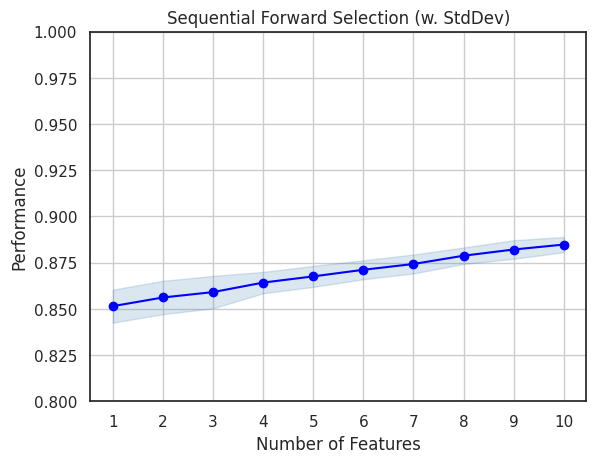

In [507]:
fig1 = plot_sfs(sfs.get_metric_dict(),
                kind='std_dev'
                )

plt.ylim([0.8, 1])
plt.title('Sequential Forward Selection (w. StdDev)')
plt.grid()
plt.show()

## Correlations

Last step in feature importance investication is correlogram

<Axes: >

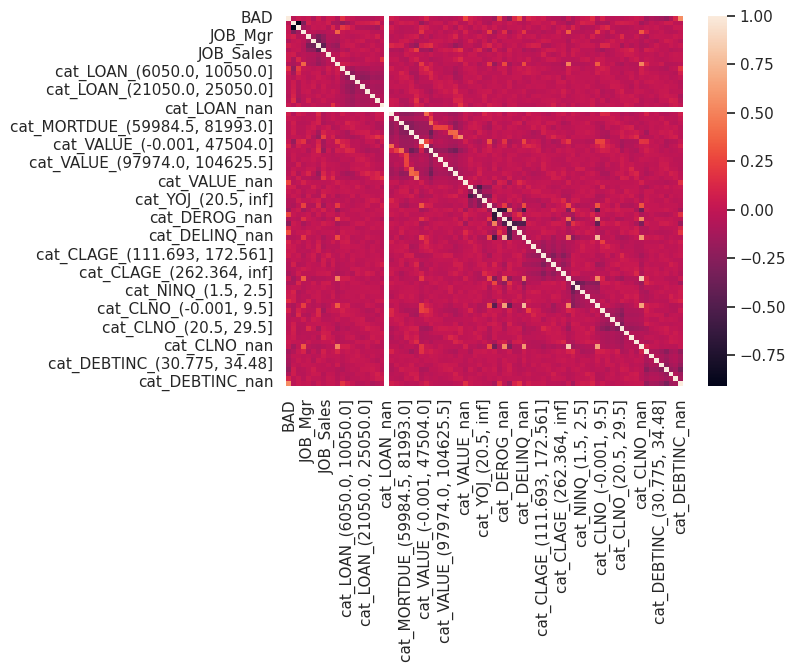

In [508]:
correlations = data_dummy.corr()
sns.heatmap(correlations)

Here we can see strongest correlations within the dataset

In [509]:
sorted_corr = correlations.unstack().sort_values(ascending = False)
sorted_corr[(abs(sorted_corr) >= 0.75) & (abs(sorted_corr) != 1)]

cat_CLNO_nan    cat_CLAGE_nan     0.842601
cat_CLAGE_nan   cat_CLNO_nan      0.842601
cat_NINQ_nan    cat_DELINQ_nan    0.763702
cat_DELINQ_nan  cat_NINQ_nan      0.763702
cat_DEROG_nan   cat_DELINQ_nan    0.759543
cat_DELINQ_nan  cat_DEROG_nan     0.759543
REASON_DebtCon  REASON_HomeImp   -0.907289
REASON_HomeImp  REASON_DebtCon   -0.907289
dtype: float64

More importantly we see that correlations among the features selected by SFS are not strong, thus giving us further confidence in selection of these features for our model

<Axes: >

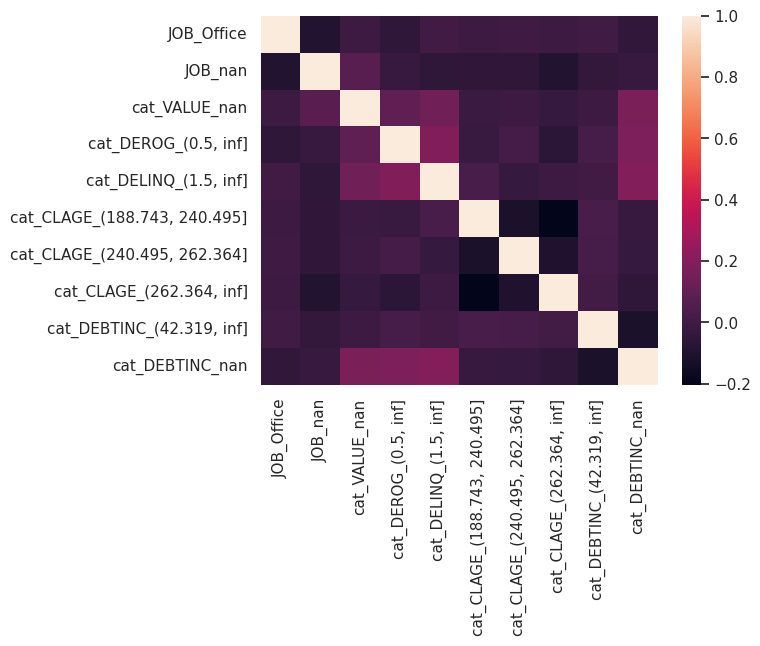

In [510]:
correlations = data_dummy[selected_features].corr()
sns.heatmap(correlations)

# Logistic Regression

## Model

In [511]:
import statsmodels.api as sm

Based on p-values from Logistic Regression we can identify that `cat_DEROG_(0.5, inf]` is a insignificant features for our model

In [512]:
logit_sm = sm.Logit(y_train, X_train[selected_features])
model_result = logit_sm.fit()
model_result.summary()

Optimization terminated successfully.
         Current function value: 0.454729
         Iterations 7


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                    BAD   No. Observations:                 4470
Model:                          Logit   Df Residuals:                     4460
Method:                           MLE   Df Model:                            9
Date:                Mon, 17 Apr 2023   Pseudo R-squ.:                 0.07439
Time:                        20:54:06   Log-Likelihood:                -2032.6
converged:                       True   LL-Null:                       -2196.0
Covariance Type:            nonrobust   LLR p-value:                 5.504e-65
================================================================================================
                                   coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------
JOB_Office                      -2.0172      0.132    -15.259      0.000      -2.276      -1.758
JOB_nan                         -3.3443      0.343     -9.749      0.000      -4.017      -2.672
cat_VALUE_nan                    3.9938      0.584      6.843      0.000       2.850       5.138
cat_DEROG_(0.5, inf]            -0.0448      0.113     -0.397      0.691      -0.266       0.176
cat_DELINQ_(1.5, inf]            0.8942      0.142      6.306      0.000       0.616       1.172
cat_CLAGE_(188.743, 240.495]    -2.2471      0.115    -19.480      0.000      -2.473      -2.021
cat_CLAGE_(240.495, 262.364]    -2.6626      0.245    -10.863      0.000      -3.143      -2.182
cat_CLAGE_(262.364, inf]        -2.7318      0.147    -18.549      0.000      -3.021      -2.443
cat_DEBTINC_(42.319, inf]        0.7674      0.173      4.440      0.000       0.429       1.106
cat_DEBTINC_nan                  1.3864      0.095     14.604      0.000       1.200       1.572
================================================================================================
"""

Now we reached a Logistic Regression model with only significant features

In [513]:
remove_this = ['cat_DEROG_(0.5, inf]']
significant_vars = [e for e in selected_features if e not in remove_this]

logit_sm = sm.Logit(y_train, X_train[significant_vars])
model_result = logit_sm.fit()
model_result.summary()

Optimization terminated successfully.
         Current function value: 0.454746
         Iterations 7


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                    BAD   No. Observations:                 4470
Model:                          Logit   Df Residuals:                     4461
Method:                           MLE   Df Model:                            8
Date:                Mon, 17 Apr 2023   Pseudo R-squ.:                 0.07436
Time:                        20:54:07   Log-Likelihood:                -2032.7
converged:                       True   LL-Null:                       -2196.0
Covariance Type:            nonrobust   LLR p-value:                 8.994e-66
================================================================================================
                                   coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------
JOB_Office                      -2.0177      0.132    -15.264      0.000      -2.277      -1.759
JOB_nan                         -3.3442      0.343     -9.751      0.000      -4.016      -2.672
cat_VALUE_nan                    3.9874      0.584      6.832      0.000       2.844       5.131
cat_DELINQ_(1.5, inf]            0.8874      0.141      6.303      0.000       0.611       1.163
cat_CLAGE_(188.743, 240.495]    -2.2487      0.115    -19.511      0.000      -2.475      -2.023
cat_CLAGE_(240.495, 262.364]    -2.6654      0.245    -10.880      0.000      -3.146      -2.185
cat_CLAGE_(262.364, inf]        -2.7319      0.147    -18.552      0.000      -3.021      -2.443
cat_DEBTINC_(42.319, inf]        0.7614      0.172      4.420      0.000       0.424       1.099
cat_DEBTINC_nan                  1.3776      0.092     14.922      0.000       1.197       1.559
================================================================================================
"""

In [514]:
logit = LogisticRegression()
logit.fit(X_train[significant_vars], y_train)

LogisticRegression()

## Diagnostics

In order to verify model predictive power construct AUC

- with 9 categories we are able to:
    - accurately predict 77% of observations
    - reach accuracy of 88%

Models predictive power is acceptable, with a space for improvement


In [515]:
confusion_matrixx = confusion_matrix(y_test, logit.predict(X_test[significant_vars]))
print(confusion_matrixx)

print(classification_report(y_test, logit.predict(X_test[significant_vars])))

[[1119   47]
 [ 138  186]]
              precision    recall  f1-score   support

           0       0.89      0.96      0.92      1166
           1       0.80      0.57      0.67       324

    accuracy                           0.88      1490
   macro avg       0.84      0.77      0.80      1490
weighted avg       0.87      0.88      0.87      1490



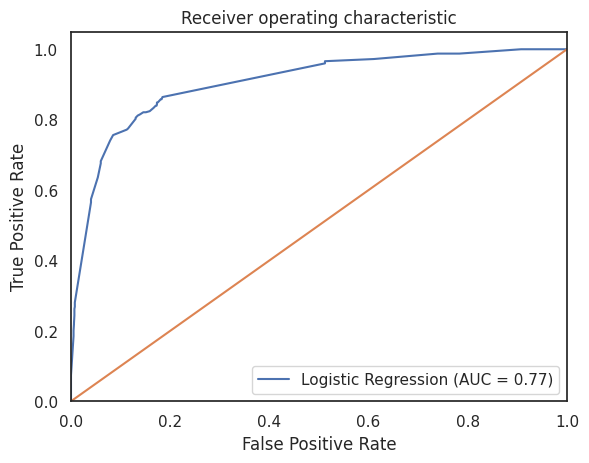

In [516]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
logit_roc_auc = roc_auc_score(y_test, logit.predict(X_test[significant_vars]))
fpr, tpr, thresholds = roc_curve(y_test, logit.predict_proba(X_test[significant_vars])[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Logistic Regression (AUC = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1])
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc='lower right')
plt.savefig('Log_ROC')
plt.show()

# XG Boost - Gradient Boosted Random Tree

XGBoost, which stands for Extreme Gradient Boosting, is a scalable, distributed gradient-boosted decision tree (GBDT) machine learning library. It provides parallel tree boosting and is the leading machine learning library for regression, classification, and ranking problems. 

In [517]:
!pip install xgboost

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [518]:
X_train_logit = X_train.copy()
y_train_logit = y_train.copy()
X_test_logit = X_test.copy()
y_test_logit = y_test.copy()

In [519]:
selected_features_XGB = [selected_features_XGB.replace(']', '') for selected_features_XGB in selected_features]
dummy_features_XGB = [dummy_features_XGB.replace(']', '') for dummy_features_XGB in dummy_features]

In [520]:
for i in range(len(dummy_features)):
  X_train.rename(columns = {dummy_features[i]:dummy_features_XGB[i]}, inplace = True)
  X_test.rename(columns = {dummy_features[i]:dummy_features_XGB[i]}, inplace = True)

X_train = X_train[selected_features]
X_train.colums = selected_features_XGB
X_train.colums

## XGB Dmatrix preparation

Transforming data into native XGB matrices

In [521]:
import xgboost as xgb

dtrain_clf = xgb.DMatrix(X_train[selected_features_XGB], y_train, enable_categorical=True)
dtest_clf = xgb.DMatrix(X_test[selected_features_XGB], y_test, enable_categorical=True)


## Model

constructing XGB model based on features selected from Sequential Feature Selector. 
These are identical data with those used in logistic regression.

In [522]:
########### OG Params
params = {
    "eta": 0.2,
    'learning_rate' : 0.5,
    "max_depth": 6,
    "objective": "binary:logistic",
    #"silent": 0,
    "base_score": np.mean(y_train),
    "eval_metric": ['logloss', 'auc']
}

In [523]:
params = {
    "eta": 0.1,
    'learning_rate' : 0.5,
    "max_depth": 6,
    'max_leaves' : 10,
    'max_leaf_nodes' : 10,
    'min_child_weight' : 1,
    'subsample' : 0.8,
    'colsample_bytree' : 0.1,
    #'gama' : 0.4,
    #'lambda' : 0.04,
    'n_estimators' : 20,
    #'n_estimators' : 1000,
    "objective": "binary:logistic",
    #"silent": 0,
    "base_score": np.mean(y_train),
    "eval_metric": ['logloss', 'auc']
}


evals_result_XGB = {}

XGB_model = xgb.train(params, dtrain_clf, 100, 
                      [(dtrain_clf, "train"), (dtest_clf, "valid")], 
                      early_stopping_rounds=10, 
                      verbose_eval=True, 
                      evals_result=evals_result_XGB)

[20:54:12] WARNING: ../src/learner.cc:767: 
Parameters: { "max_leaf_nodes", "n_estimators" } are not used.

[0]	train-logloss:0.46312	train-auc:0.60172	valid-logloss:0.48851	valid-auc:0.61916
[1]	train-logloss:0.46013	train-auc:0.60172	valid-logloss:0.48466	valid-auc:0.61916
[2]	train-logloss:0.45542	train-auc:0.64170	valid-logloss:0.47981	valid-auc:0.65891
[3]	train-logloss:0.45236	train-auc:0.67958	valid-logloss:0.47853	valid-auc:0.68009
[4]	train-logloss:0.43884	train-auc:0.70003	valid-logloss:0.46101	valid-auc:0.70579
[5]	train-logloss:0.43647	train-auc:0.71517	valid-logloss:0.45883	valid-auc:0.72046
[6]	train-logloss:0.43353	train-auc:0.71553	valid-logloss:0.45546	valid-auc:0.72109
[7]	train-logloss:0.43286	train-auc:0.71278	valid-logloss:0.45555	valid-auc:0.71623
[8]	train-logloss:0.41562	train-auc:0.75567	valid-logloss:0.44650	valid-auc:0.73278
[9]	train-logloss:0.41467	train-auc:0.75571	valid-logloss:0.44534	valid-auc:0.73304
[10]	train-logloss:0.34394	train-auc:0.85953	valid-l

Pass `evals` as keyword args.


[25]	train-logloss:0.30292	train-auc:0.89081	valid-logloss:0.30691	valid-auc:0.90555
[26]	train-logloss:0.30289	train-auc:0.89081	valid-logloss:0.30688	valid-auc:0.90556
[27]	train-logloss:0.30283	train-auc:0.89085	valid-logloss:0.30654	valid-auc:0.90547
[28]	train-logloss:0.30270	train-auc:0.89049	valid-logloss:0.30672	valid-auc:0.90517
[29]	train-logloss:0.30225	train-auc:0.89160	valid-logloss:0.30589	valid-auc:0.90657
[30]	train-logloss:0.30225	train-auc:0.89160	valid-logloss:0.30599	valid-auc:0.90657
[31]	train-logloss:0.30127	train-auc:0.89139	valid-logloss:0.30584	valid-auc:0.90569
[32]	train-logloss:0.30127	train-auc:0.89139	valid-logloss:0.30604	valid-auc:0.90569
[33]	train-logloss:0.30121	train-auc:0.89139	valid-logloss:0.30570	valid-auc:0.90574
[34]	train-logloss:0.30109	train-auc:0.89114	valid-logloss:0.30542	valid-auc:0.90576
[35]	train-logloss:0.30058	train-auc:0.89125	valid-logloss:0.30561	valid-auc:0.90513
[36]	train-logloss:0.29831	train-auc:0.89194	valid-logloss:0.3012

<Axes: title={'center': 'Feature importance'}, xlabel='F score', ylabel='Features'>

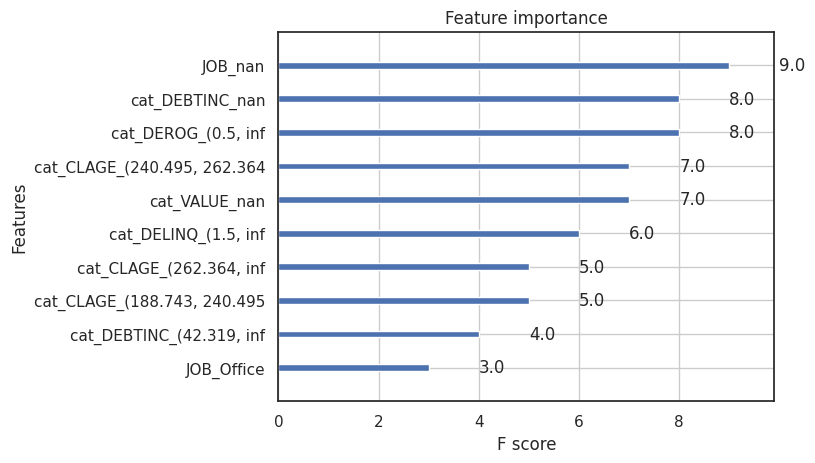

In [526]:
from xgboost import plot_importance
plot_importance(XGB_model)


In [527]:
max(evals_result_XGB['valid']['auc'])

0.9092775236643161

## Diagnostics

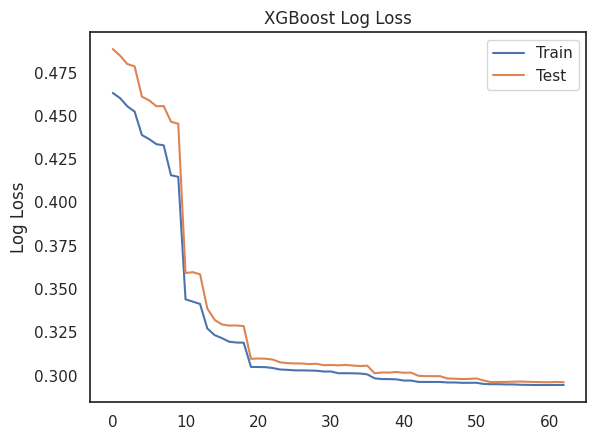

In [528]:
# plot log loss
epochs = len(evals_result_XGB['train']['logloss'])
x_axis = range(0, epochs)

fig, ax = plt.subplots()
ax.plot(x_axis, evals_result_XGB['train']['logloss'], label='Train')
ax.plot(x_axis, evals_result_XGB['valid']['logloss'], label='Test')
ax.legend()
plt.ylabel('Log Loss')
plt.title('XGBoost Log Loss')
plt.show()

In [529]:
pred_XGB = pd.Series(XGB_model.predict(dtest_clf))

In [530]:
confusion_matrixx = confusion_matrix(y_test, round(pred_XGB))
print(confusion_matrixx)

print(classification_report(y_test, round(pred_XGB)))

[[1106   60]
 [ 125  199]]
              precision    recall  f1-score   support

           0       0.90      0.95      0.92      1166
           1       0.77      0.61      0.68       324

    accuracy                           0.88      1490
   macro avg       0.83      0.78      0.80      1490
weighted avg       0.87      0.88      0.87      1490



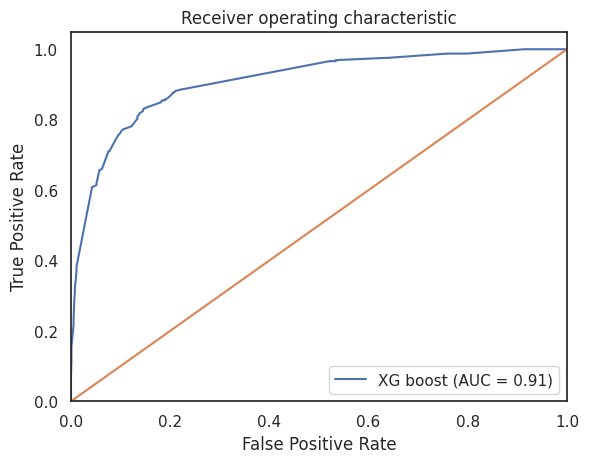

In [531]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
XGB_roc_auc = roc_auc_score(y_test, pred_XGB)
fpr, tpr, thresholds = roc_curve(y_test, pred_XGB)
plt.figure()
plt.plot(fpr, tpr, label='XG boost (AUC = %0.2f)' % XGB_roc_auc)
plt.plot([0, 1], [0, 1])
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc='lower right')
plt.savefig('Log_ROC')
plt.show()

## Interpretability

In [532]:
!pip install shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [533]:
import shap

explainer = shap.TreeExplainer(model = XGB_model, data = X_train[selected_features_XGB], feature_perturbation = 'interventional', model_output = 'probability')
shap_values = explainer.shap_values(X_test[selected_features_XGB])

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


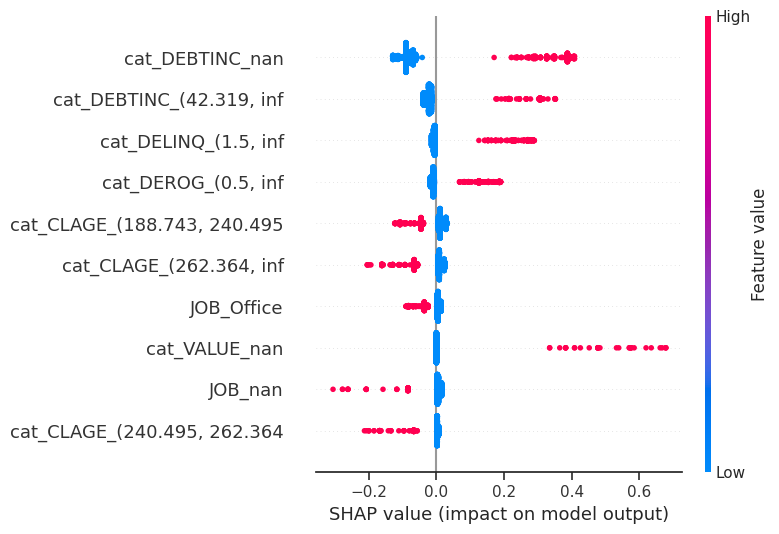

In [534]:
shap.initjs()
shap.summary_plot( shap_values, X_test[selected_features_XGB])


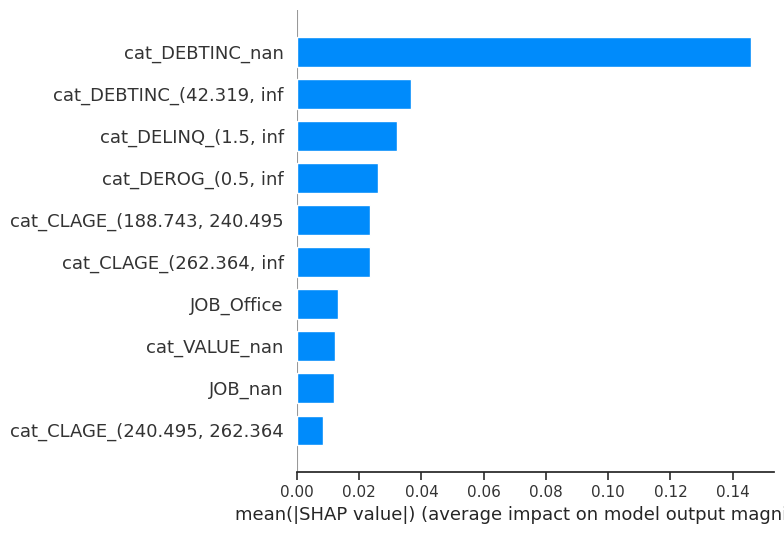

In [535]:
shap.summary_plot(shap_values, X_test[selected_features_XGB], plot_type="bar")

In [394]:
shap.initjs()
shap_values = explainer.shap_values(X[selected_features])
shap.force_plot(explainer.expected_value, shap_values, X[selected_features])


shap.plots.force is slow for many thousands of rows, try subsampling your data.


# ML XGB 

no term paper is complete withour overfiting models.

### Thus for the sake of curiosity we propose ML XGB; **Mad Lad Extreme Gradient Boosted Decision Tree**.

In this model we use XGB as before, but feed it with entire dataset, instead of just 10 features as in the XGB.

Then we will use Shapley Additive Values to interpret the impact of the most important features selected by ML XGB.

## Dmatrix

In [395]:
import xgboost as xgb

dtrain_clf = xgb.DMatrix(X_train, y_train, enable_categorical=True)
dtest_clf = xgb.DMatrix(X_test, y_test, enable_categorical=True)

## model

In [396]:
params = {
    "eta": 0.1,
    'learning_rate' : 0.15,
    "max_depth": 20,
    'max_leaves' : 20,
    'max_leaf_nodes' : 20,
    #'min_child_weight' : 1,
    #'subsample' : 0.8,
    'colsample_bytree' : 0.5,
    #'gama' : 0.4,
    #'lambda' : 0.04,
    'n_estimators' : 80,
    #'n_estimators' : 1000,
    "objective": "binary:logistic",
    #"silent": 0,
    "base_score": np.mean(y_train),
    "eval_metric": ['logloss', 'auc']
}


evals_result_XGB = {}

XGB_model = xgb.train(params, dtrain_clf, 1000, 
                      [(dtrain_clf, "train"), (dtest_clf, "valid")], 
                      early_stopping_rounds=20, 
                      verbose_eval=True, 
                      evals_result=evals_result_XGB)

Pass `evals` as keyword args.


[18:28:33] WARNING: ../src/learner.cc:767: 
Parameters: { "max_leaf_nodes", "n_estimators" } are not used.

[0]	train-logloss:0.42737	train-auc:0.91772	valid-logloss:0.46035	valid-auc:0.89217
[1]	train-logloss:0.39074	train-auc:0.94984	valid-logloss:0.42982	valid-auc:0.91102
[2]	train-logloss:0.35694	train-auc:0.96754	valid-logloss:0.40422	valid-auc:0.91369
[3]	train-logloss:0.32720	train-auc:0.97279	valid-logloss:0.37848	valid-auc:0.92473
[4]	train-logloss:0.30415	train-auc:0.97987	valid-logloss:0.36362	valid-auc:0.92934
[5]	train-logloss:0.28174	train-auc:0.98433	valid-logloss:0.34724	valid-auc:0.93530
[6]	train-logloss:0.26195	train-auc:0.98481	valid-logloss:0.32880	valid-auc:0.94107
[7]	train-logloss:0.24522	train-auc:0.98556	valid-logloss:0.31567	valid-auc:0.94228
[8]	train-logloss:0.23028	train-auc:0.98615	valid-logloss:0.30332	valid-auc:0.94425
[9]	train-logloss:0.21713	train-auc:0.98703	valid-logloss:0.29282	valid-auc:0.94592
[10]	train-logloss:0.20546	train-auc:0.98864	valid-l

In [397]:
max(evals_result_XGB['valid']['auc'])

0.9678361179933507

Visualising all 80 features with their importance

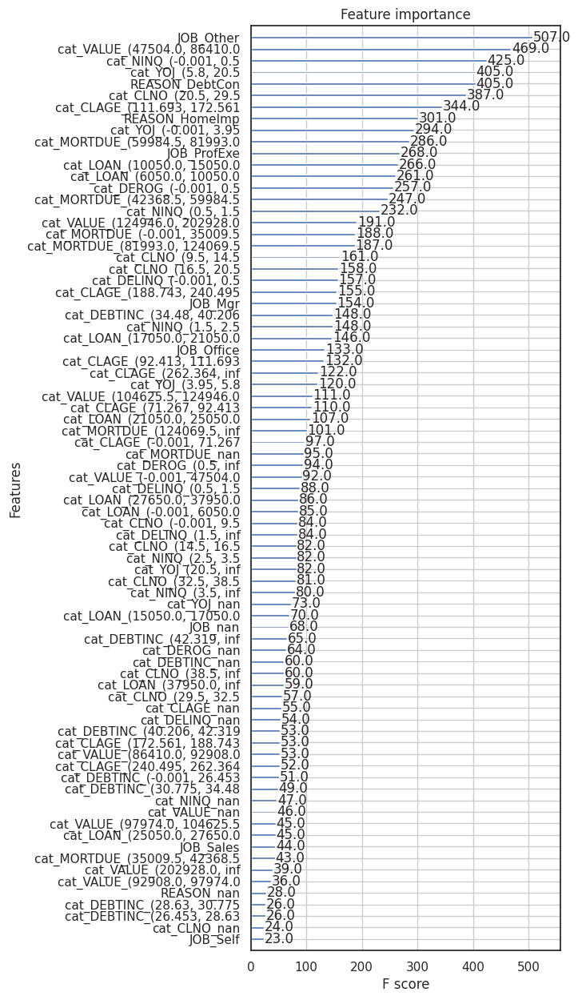

In [398]:
from xgboost import plot_importance
ax = plot_importance(XGB_model)
fig = ax.figure
fig.set_size_inches(5, 15)

## Diagnostics

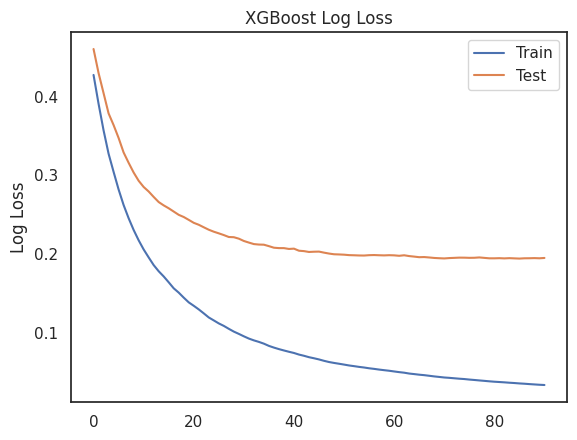

In [399]:
# plot log loss
epochs = len(evals_result_XGB['train']['logloss'])
x_axis = range(0, epochs)

fig, ax = plt.subplots()
ax.plot(x_axis, evals_result_XGB['train']['logloss'], label='Train')
ax.plot(x_axis, evals_result_XGB['valid']['logloss'], label='Test')
ax.legend()
plt.ylabel('Log Loss')
plt.title('XGBoost Log Loss')
plt.show()

In [400]:
pred_XGB = pd.Series(XGB_model.predict(dtest_clf))

In [401]:
confusion_matrixx = confusion_matrix(y_test, round(pred_XGB))
print(confusion_matrixx)

print(classification_report(y_test, round(pred_XGB)))

[[1138   28]
 [  93  231]]
              precision    recall  f1-score   support

           0       0.92      0.98      0.95      1166
           1       0.89      0.71      0.79       324

    accuracy                           0.92      1490
   macro avg       0.91      0.84      0.87      1490
weighted avg       0.92      0.92      0.92      1490



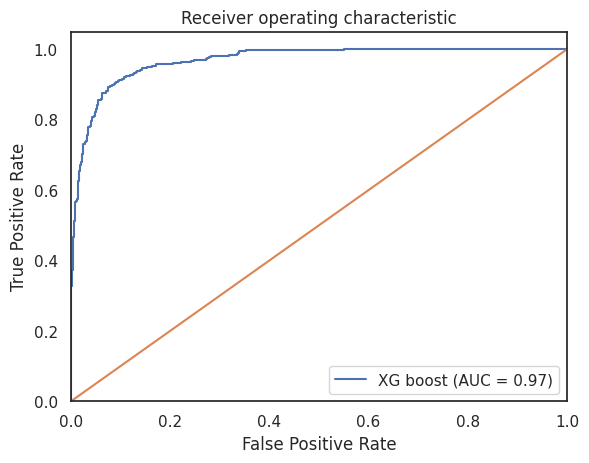

In [402]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
XGB_roc_auc = roc_auc_score(y_test, pred_XGB)
fpr, tpr, thresholds = roc_curve(y_test, pred_XGB)
plt.figure()
plt.plot(fpr, tpr, label='XG boost (AUC = %0.2f)' % XGB_roc_auc)
plt.plot([0, 1], [0, 1])
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc='lower right')
plt.savefig('Log_ROC')
plt.show()

## Interpretability

In [403]:
import shap

explainer = shap.TreeExplainer(model = XGB_model, data = X_train, feature_perturbation = 'interventional', model_output = 'probability')
shap_values = explainer.shap_values(X_test)

 96%|=================== | 1424/1490 [00:19<00:00]       

Visualising top features with their impact on target

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


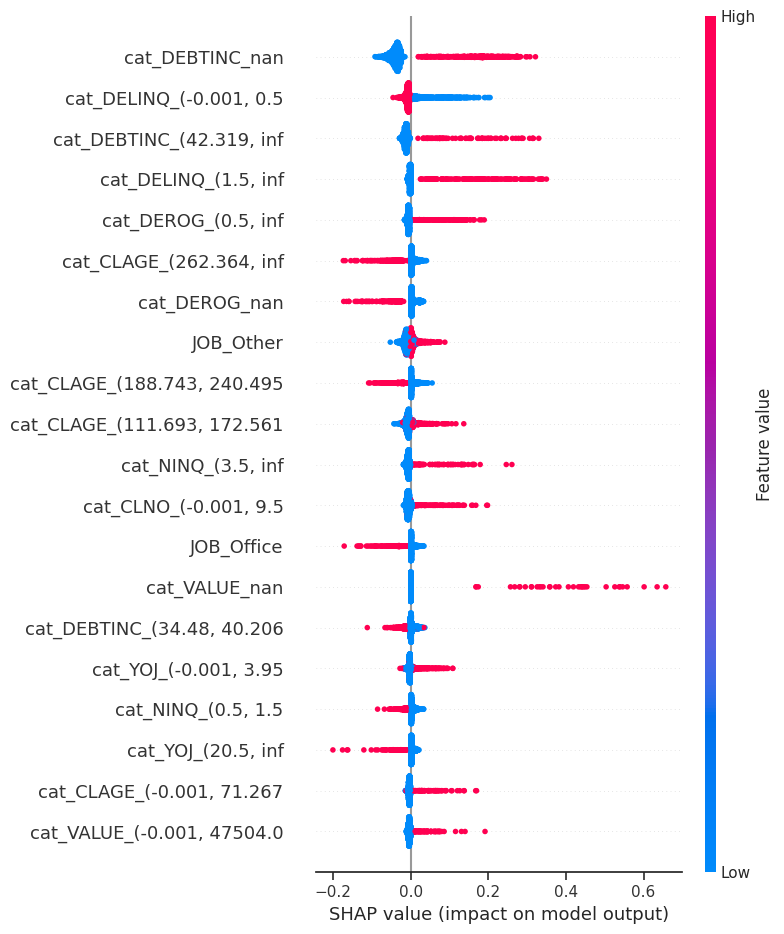

In [404]:
shap.initjs()
shap.summary_plot( shap_values, X_test)


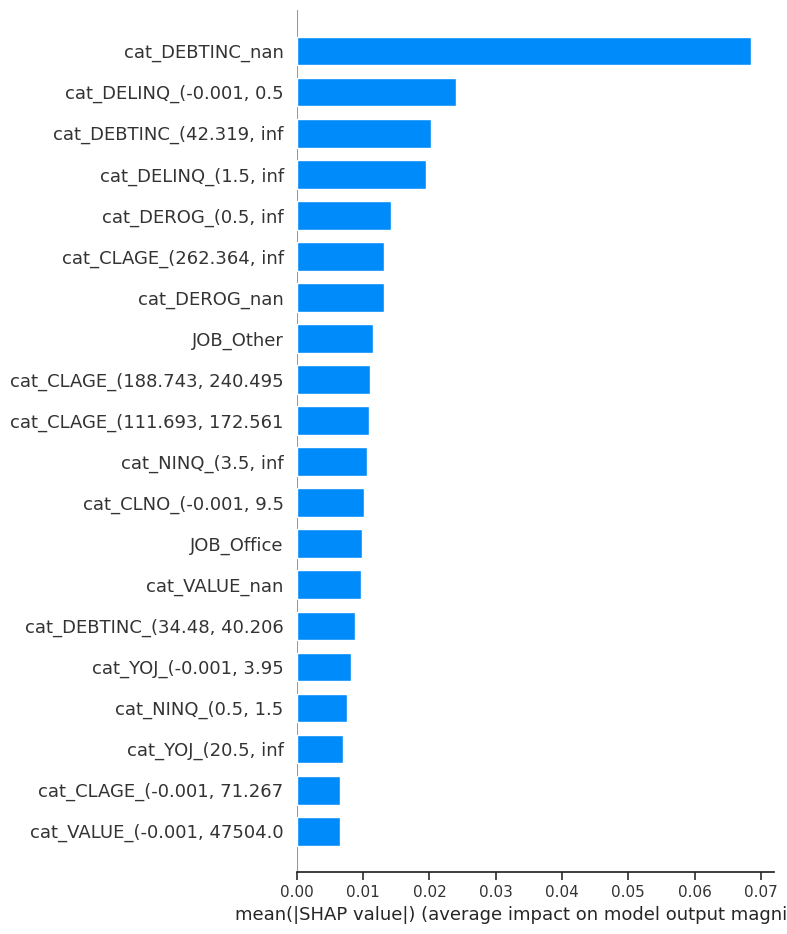

In [405]:
shap.summary_plot(shap_values, X_test, plot_type="bar")